In [1]:
# Install Required Packages
!pip install -q sentencepiece
!pip install -q evaluate rouge-score bert-score
!pip install -q grad-cam
!pip install -q albumentations
print("All required packages installed successfully.")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.1/61.1 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 90.8 MB/s eta 0:00:00:00:01:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask-cuda 26.2.0 requires cuda-core==0.3.*, but you have cuda-core 1.0.1 which is incompatible.
dask-cuda 26.2.0 requires numba-cuda<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
distributed-ucxx-cu12 0.48.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
cuml-cu12 26.2.0 requires numba<0.62.0,>=0.60.0, but you have numba 0.65.1 which is incompatible.
cuml-cu12 26.2.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
ucxx-cu12 0.48.0 requires numba-cuda[cu

In [2]:
# Import Libraries
import os
import gc
import re
import cv2
import json
import math
import time
import random
import warnings
import platform
from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm

from PIL import Image

import albumentations as A
from albumentations.pytorch import ToTensorV2

# from sklearn.model_selection import train_test_split
# from sklearn.metrics import (
#     accuracy_score,
#     precision_score,
#     recall_score,
#     f1_score,
#     confusion_matrix
# )

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from torch.utils.data import (
    Dataset,
    DataLoader
)

import torchvision
from torchvision import models

from transformers import (
    AutoTokenizer,
    AutoModel,
    GPT2Tokenizer,
    GPT2LMHeadModel,
    GPT2Config
)

from transformers import logging
logging.set_verbosity_error()

warnings.filterwarnings("ignore")

print("All libraries imported successfully.")

All libraries imported successfully.


In [3]:
# Device Configuration
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(f"Random Seed: {SEED}")
print(f"Device: {device}")

Random Seed: 42
Device: cuda


In [4]:
# System Information
import psutil
import subprocess
import platform

print("SYSTEM INFORMATION:")
print(f"Operating System : {platform.system()} {platform.release()}")
print(f"Python Version   : {platform.python_version()}")
print(f"CPU              : {platform.processor()}")
print(f"CPU Cores        : {psutil.cpu_count(logical=False)}")
print(f"Logical Threads  : {psutil.cpu_count(logical=True)}")
ram_gb = psutil.virtual_memory().total / (1024**3)
print(f"RAM              : {ram_gb:.2f} GB")
print(f"PyTorch Version  : {torch.__version__}")
print(f"Torchvision      : {torchvision.__version__}")
print(f"CUDA Available   : {torch.cuda.is_available()}")

if torch.cuda.is_available():
    print(f"CUDA Version     : {torch.version.cuda}")
    gpu_name = torch.cuda.get_device_name(0)
    gpu_props = torch.cuda.get_device_properties(0)
    gpu_vram = gpu_props.total_memory / (1024**3)
    print(f"GPU              : {gpu_name}")
    print(f"GPU VRAM         : {gpu_vram:.2f} GB")

else:
    print("GPU              : Not Available")

SYSTEM INFORMATION:
Operating System : Linux 6.12.90+
Python Version   : 3.12.13
CPU              : x86_64
CPU Cores        : 2
Logical Threads  : 4
RAM              : 31.35 GB
PyTorch Version  : 2.10.0+cu128
Torchvision      : 0.25.0+cu128
CUDA Available   : True
CUDA Version     : 12.8
GPU              : Tesla T4
GPU VRAM         : 14.56 GB


In [5]:
# Configuration Cell
MAX_INDICATION_LENGTH = 64 # 64
MAX_REPORT_LENGTH = 256 # 256

BATCH_SIZE = 8 # 2, 4, 8, 16

DROPOUT = 0.4 # 0.2, 0.3, 0.4

NUM_EPOCHS = 40 # 5, 10, 20

LEARNING_RATE = 5e-5 # 1e-4, 5e-5

WEIGHT_DECAY = 1e-3 # 1e-4, 1e-3

GRADIENT_CLIP_VALUE = 1.0

MAX_NEW_TOKENS = 128 # 256

In [6]:
# DATASET LOADING
BASE_PATH = "/kaggle/input/datasets/raddar/chest-xrays-indiana-university"
REPORTS_PATH = os.path.join(BASE_PATH, "indiana_reports.csv")
PROJECTIONS_PATH = os.path.join(BASE_PATH, "indiana_projections.csv")
IMAGES_PATH = os.path.join(BASE_PATH, "images/images_normalized")
print("Reports Path     :", REPORTS_PATH)
print("Projections Path :", PROJECTIONS_PATH)
print("Images Path      :", IMAGES_PATH)
indiana_reports_df = pd.read_csv(REPORTS_PATH)
indiana_projections_df = pd.read_csv(PROJECTIONS_PATH)
image_files = os.listdir(IMAGES_PATH)

print("\nDATASET INSPECTION:")
print(f"Total Reports Found     : {len(indiana_reports_df)}")
print(f"Total Projections Found : {len(indiana_projections_df)}")
print(f"Total Images Found      : {len(image_files)}")

Reports Path     : /kaggle/input/datasets/raddar/chest-xrays-indiana-university/indiana_reports.csv
Projections Path : /kaggle/input/datasets/raddar/chest-xrays-indiana-university/indiana_projections.csv
Images Path      : /kaggle/input/datasets/raddar/chest-xrays-indiana-university/images/images_normalized

DATASET INSPECTION:
Total Reports Found     : 3851
Total Projections Found : 7466
Total Images Found      : 7470


In [7]:
print("REPORTS DATAFRAME:")
display(indiana_reports_df.head())
print(f"Reports DataFrame Shape: {indiana_reports_df.shape}")
print(f"Total Unique UIDs Found: {indiana_reports_df['uid'].nunique()}")
# indiana_reports_df.info()
print("\nColumns:")
# for i, col in enumerate(indiana_reports_df.columns):
#     print(f"{i+1:2d}. {col}")
# print("\nData Types:")
# display(indiana_reports_df.dtypes)
# print("\nMissing Values:")
# display(indiana_reports_df.isnull().sum())
reports_summary_df = pd.DataFrame({
    'Missing Values': indiana_reports_df.isna().sum(),
    'Data Type': indiana_reports_df.dtypes
})
print(reports_summary_df)

REPORTS DATAFRAME:


,uid,MeSH,Problems,image,indication,comparison,findings,impression
0,1,normal,normal,Xray Chest PA and Lateral,Positive TB test,None.,The cardiac silhouette and mediastinum size ar...,Normal chest x-XXXX.
1,2,Cardiomegaly/borderline;Pulmonary Artery/enlarged,Cardiomegaly;Pulmonary Artery,"Chest, 2 views, frontal and lateral",Preop bariatric surgery.,None.,Borderline cardiomegaly. Midline sternotomy XX...,No acute pulmonary findings.
2,3,normal,normal,Xray Chest PA and Lateral,"rib pain after a XXXX, XXXX XXXX steps this XX...",NaN,NaN,"No displaced rib fractures, pneumothorax, or p..."
3,4,"Pulmonary Disease, Chronic Obstructive;Bullous...","Pulmonary Disease, Chronic Obstructive;Bullous...","PA and lateral views of the chest XXXX, XXXX a...",XXXX-year-old XXXX with XXXX.,None available,There are diffuse bilateral interstitial and a...,1. Bullous emphysema and interstitial fibrosis...
4,5,Osteophyte/thoracic vertebrae/multiple/small;T...,Osteophyte;Thickening;Lung,Xray Chest PA and Lateral,Chest and nasal congestion.,NaN,The cardiomediastinal silhouette and pulmonary...,No acute cardiopulmonary abnormality.


Reports DataFrame Shape: (3851, 8)
Total Unique UIDs Found: 3851

Columns:
            Missing Values Data Type
uid                      0     int64
MeSH                     0    object
Problems                 0    object
image                    0    object
indication              86    object
comparison            1166    object
findings               514    object
impression              31    object


In [8]:
print("PROJECTIONS DATAFRAME:")
display(indiana_projections_df.head())
print(f"Projections DataFrame Shape: {indiana_projections_df.shape}")
print(f"Total Unique UIDs Found    : {indiana_projections_df['uid'].nunique()}")
print("\nColumns:")
projections_summary_df = pd.DataFrame({
    'Missing Values': indiana_projections_df.isna().sum(),
    'Data Type': indiana_projections_df.dtypes
})
print(projections_summary_df)
print("\n")
view_counts = indiana_projections_df['projection'].value_counts()
print(view_counts)

PROJECTIONS DATAFRAME:


,uid,filename,projection
0,1,1_IM-0001-4001.dcm.png,Frontal
1,1,1_IM-0001-3001.dcm.png,Lateral
2,2,2_IM-0652-1001.dcm.png,Frontal
3,2,2_IM-0652-2001.dcm.png,Lateral
4,3,3_IM-1384-1001.dcm.png,Frontal


Projections DataFrame Shape: (7466, 3)
Total Unique UIDs Found    : 3851

Columns:
            Missing Values Data Type
uid                      0     int64
filename                 0    object
projection               0    object


projection
Frontal    3818
Lateral    3648
Name: count, dtype: int64


Total Images Found : 7470


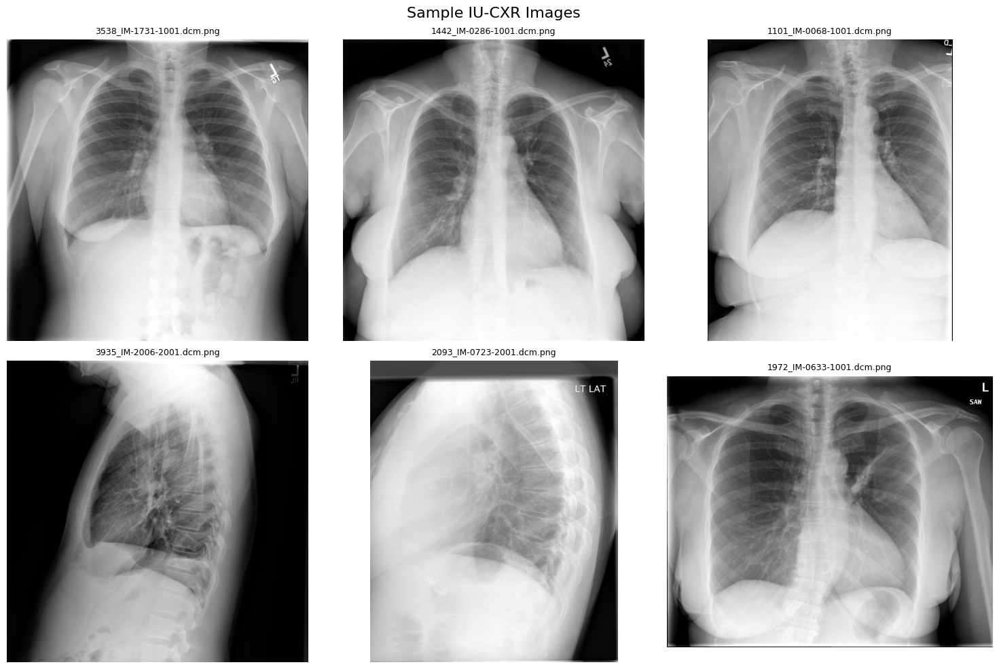

In [9]:
img_files = sorted(list(Path(IMAGES_PATH).glob("*")))
print(f"Total Images Found : {len(img_files)}")

num_samples = 6
sample_images = random.sample(img_files, num_samples)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()
for ax, img_path in zip(axes, sample_images):
    img = Image.open(img_path)
    ax.imshow(img, cmap="gray")
    ax.set_title(img_path.name, fontsize=9)
    ax.axis("off")

plt.suptitle("Sample IU-CXR Images", fontsize=16)
plt.tight_layout()
plt.show()

Minimum images per patient: 1
Maximum images per patient: 5

Images per patient vs number of patients:
1 images : 446 records
2 images : 3210 records
3 images : 181 records
4 images : 13 records
5 images : 1 records


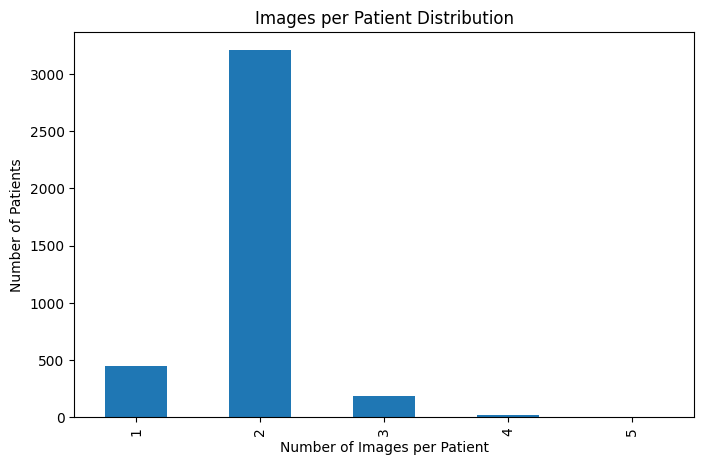

In [10]:
# Images per Patient
images_per_uid = indiana_projections_df.groupby('uid').size()
print("Minimum images per patient:", images_per_uid.min())
print("Maximum images per patient:", images_per_uid.max())
freq_table = images_per_uid.value_counts().sort_index()
print("\nImages per patient vs number of patients:")
for num_images, num_patients in freq_table.items():
    print(f"{num_images} images : {num_patients} records")

plt.figure(figsize=(8,5))
freq_table.plot(kind='bar')
plt.title("Images per Patient Distribution")
plt.xlabel("Number of Images per Patient")
plt.ylabel("Number of Patients")
plt.show()

In [11]:
# DATASET FILTERING
# Merge Reports and Projections
indiana_merged_df = pd.merge(indiana_reports_df, indiana_projections_df, on="uid", how="inner")

print("MERGED DATAFRAME:")
print(f"Unique UIDs: {len(indiana_merged_df)}")
print(f"Shape: {indiana_merged_df.shape}")
display(indiana_merged_df.head())
# print("\nColumns:", indiana_merged_df.columns.tolist())

MERGED DATAFRAME:
Unique UIDs: 7466
Shape: (7466, 10)


,uid,MeSH,Problems,image,indication,comparison,findings,impression,filename,projection
0,1,normal,normal,Xray Chest PA and Lateral,Positive TB test,None.,The cardiac silhouette and mediastinum size ar...,Normal chest x-XXXX.,1_IM-0001-4001.dcm.png,Frontal
1,1,normal,normal,Xray Chest PA and Lateral,Positive TB test,None.,The cardiac silhouette and mediastinum size ar...,Normal chest x-XXXX.,1_IM-0001-3001.dcm.png,Lateral
2,2,Cardiomegaly/borderline;Pulmonary Artery/enlarged,Cardiomegaly;Pulmonary Artery,"Chest, 2 views, frontal and lateral",Preop bariatric surgery.,None.,Borderline cardiomegaly. Midline sternotomy XX...,No acute pulmonary findings.,2_IM-0652-1001.dcm.png,Frontal
3,2,Cardiomegaly/borderline;Pulmonary Artery/enlarged,Cardiomegaly;Pulmonary Artery,"Chest, 2 views, frontal and lateral",Preop bariatric surgery.,None.,Borderline cardiomegaly. Midline sternotomy XX...,No acute pulmonary findings.,2_IM-0652-2001.dcm.png,Lateral
4,3,normal,normal,Xray Chest PA and Lateral,"rib pain after a XXXX, XXXX XXXX steps this XX...",NaN,NaN,"No displaced rib fractures, pneumothorax, or p...",3_IM-1384-1001.dcm.png,Frontal


In [12]:
# Keep Only Records with 1 Frontal and 1 Lateral Projection
FRONTAL_VIEWS = ["Frontal"]
LATERAL_VIEWS = ["Lateral"]

valid_uids = []

for uid, group in tqdm(indiana_merged_df.groupby("uid"), desc="Filtering Dual-View Studies"):
    indication = group["indication"].iloc[0]
    findings = group["findings"].iloc[0]
    impression = group["impression"].iloc[0]
    if pd.isna(indication):
        continue
    if pd.isna(findings):
        continue
    if pd.isna(impression):
        continue
    frontal_rows = group[group["projection"].isin(FRONTAL_VIEWS)]
    lateral_rows = group[group["projection"].isin(LATERAL_VIEWS)]
    if len(frontal_rows) != 1:
        continue
    if len(lateral_rows) != 1:
        continue
    frontal_file = frontal_rows["filename"].iloc[0]
    lateral_file = lateral_rows["filename"].iloc[0]
    frontal_path = os.path.join(IMAGES_PATH, frontal_file)
    lateral_path = os.path.join(IMAGES_PATH, lateral_file)
    if not os.path.exists(frontal_path):
        continue
    if not os.path.exists(lateral_path):
        continue
    valid_uids.append(uid)

dual_view_df = indiana_merged_df[indiana_merged_df["uid"].isin(valid_uids)].copy()
print("DUAL VIEW DATAFRAME:")
print(f"Valid UIDs: {len(valid_uids)}")
print(f"Shape: {dual_view_df.shape}")
display(dual_view_df.head())

Filtering Dual-View Studies:   0%|          | 0/3851 [00:00<?, ?it/s]

DUAL VIEW DATAFRAME:
Valid UIDs: 2729
Shape: (5458, 10)


,uid,MeSH,Problems,image,indication,comparison,findings,impression,filename,projection
0,1,normal,normal,Xray Chest PA and Lateral,Positive TB test,None.,The cardiac silhouette and mediastinum size ar...,Normal chest x-XXXX.,1_IM-0001-4001.dcm.png,Frontal
1,1,normal,normal,Xray Chest PA and Lateral,Positive TB test,None.,The cardiac silhouette and mediastinum size ar...,Normal chest x-XXXX.,1_IM-0001-3001.dcm.png,Lateral
2,2,Cardiomegaly/borderline;Pulmonary Artery/enlarged,Cardiomegaly;Pulmonary Artery,"Chest, 2 views, frontal and lateral",Preop bariatric surgery.,None.,Borderline cardiomegaly. Midline sternotomy XX...,No acute pulmonary findings.,2_IM-0652-1001.dcm.png,Frontal
3,2,Cardiomegaly/borderline;Pulmonary Artery/enlarged,Cardiomegaly;Pulmonary Artery,"Chest, 2 views, frontal and lateral",Preop bariatric surgery.,None.,Borderline cardiomegaly. Midline sternotomy XX...,No acute pulmonary findings.,2_IM-0652-2001.dcm.png,Lateral
6,4,"Pulmonary Disease, Chronic Obstructive;Bullous...","Pulmonary Disease, Chronic Obstructive;Bullous...","PA and lateral views of the chest XXXX, XXXX a...",XXXX-year-old XXXX with XXXX.,None available,There are diffuse bilateral interstitial and a...,1. Bullous emphysema and interstitial fibrosis...,4_IM-2050-1001.dcm.png,Frontal


In [13]:
# Final Dataset
final_records = []

for uid, group in tqdm(dual_view_df.groupby("uid"), desc="Building Final Dataset"):
    frontal_row = group[group["projection"].isin(FRONTAL_VIEWS)].iloc[0]
    lateral_row = group[group["projection"].isin(LATERAL_VIEWS)].iloc[0]
    record = {
        "uid": uid,
        "frontal_projection": frontal_row["filename"],
        "lateral_projection": lateral_row["filename"],
        "indication": group["indication"].iloc[0],
        "findings": group["findings"].iloc[0],
        "impression": group["impression"].iloc[0],
        "MeSH":
            group["MeSH"].iloc[0]
            if "MeSH" in group.columns
            else None,
        "Problems":
            group["Problems"].iloc[0]
            if "Problems" in group.columns
            else None
    }
    final_records.append(record)

reports_df = pd.DataFrame(final_records)
print("FINAL REPORTS DATAFRAME:")
display(reports_df.head())
print(f"Final Reports Dataframe Shape: {reports_df.shape}")
print(f"Total Samples : {len(reports_df)}")
print(f"Unique UIDs: {reports_df['uid'].nunique()}")
print(f"Duplicate UIDs: {reports_df['uid'].duplicated().sum()}")
print(f"\nColumns: {reports_df.columns.tolist()}")
print("\nMissing Values:")
display(reports_df.isnull().sum())

Building Final Dataset:   0%|          | 0/2729 [00:00<?, ?it/s]

FINAL REPORTS DATAFRAME:


,uid,frontal_projection,lateral_projection,indication,findings,impression,MeSH,Problems
0,1,1_IM-0001-4001.dcm.png,1_IM-0001-3001.dcm.png,Positive TB test,The cardiac silhouette and mediastinum size ar...,Normal chest x-XXXX.,normal,normal
1,2,2_IM-0652-1001.dcm.png,2_IM-0652-2001.dcm.png,Preop bariatric surgery.,Borderline cardiomegaly. Midline sternotomy XX...,No acute pulmonary findings.,Cardiomegaly/borderline;Pulmonary Artery/enlarged,Cardiomegaly;Pulmonary Artery
2,4,4_IM-2050-1001.dcm.png,4_IM-2050-2001.dcm.png,XXXX-year-old XXXX with XXXX.,There are diffuse bilateral interstitial and a...,1. Bullous emphysema and interstitial fibrosis...,"Pulmonary Disease, Chronic Obstructive;Bullous...","Pulmonary Disease, Chronic Obstructive;Bullous..."
3,5,5_IM-2117-1003002.dcm.png,5_IM-2117-1004003.dcm.png,Chest and nasal congestion.,The cardiomediastinal silhouette and pulmonary...,No acute cardiopulmonary abnormality.,Osteophyte/thoracic vertebrae/multiple/small;T...,Osteophyte;Thickening;Lung
4,6,6_IM-2192-1001.dcm.png,6_IM-2192-2001.dcm.png,Evaluate for infection,Heart size and mediastinal contour are within ...,No acute cardiopulmonary findings.,normal,normal


Final Reports Dataframe Shape: (2729, 8)
Total Samples : 2729
Unique UIDs: 2729
Duplicate UIDs: 0

Columns: ['uid', 'frontal_projection', 'lateral_projection', 'indication', 'findings', 'impression', 'MeSH', 'Problems']

Missing Values:


uid                   0
frontal_projection    0
lateral_projection    0
indication            0
findings              0
impression            0
MeSH                  0
Problems              0
dtype: int64

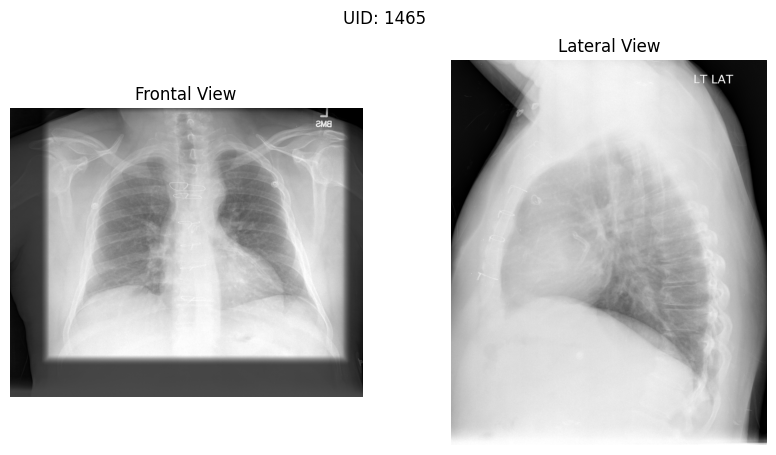

UID:
1465

INDICATION:
XXXX-year-old male with chest pain.

FINDINGS:
The heart is normal in size. Stable appearance of coronary stent. XXXX sternotomy changes are present. No focal consolidation, pneumothorax or pleural effusion. Mild degenerative changes of the thoracic spine.

IMPRESSION:
No acute cardiopulmonary abnormalities.

MeSH:
Stents/coronary vessels;Thoracic Vertebrae/degenerative/mild

Problems:
Stents;Thoracic Vertebrae


In [14]:
# Sample Record
num_samples = 1
sample_df = reports_df.sample(n=num_samples,random_state=SEED)

for _, row in sample_df.iterrows():
    uid = row["uid"]
    frontal_path = os.path.join(IMAGES_PATH, row["frontal_projection"])
    lateral_path = os.path.join(IMAGES_PATH, row["lateral_projection"])
    frontal_img = Image.open(frontal_path)
    lateral_img = Image.open(lateral_path)
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(frontal_img, cmap="gray")
    axes[0].set_title("Frontal View")
    axes[0].axis("off")
    axes[1].imshow(lateral_img, cmap="gray")
    axes[1].set_title("Lateral View")
    axes[1].axis("off")
    plt.suptitle(f"UID: {uid}")
    plt.show()
    print("UID:")
    print(uid)
    print("\nINDICATION:")
    print(row["indication"])
    print("\nFINDINGS:")
    print(row["findings"])
    print("\nIMPRESSION:")
    print(row["impression"])
    print("\nMeSH:")
    print(row["MeSH"])
    print("\nProblems:")
    print(row["Problems"])

In [15]:
# DISEASE DISTRIBUTION ANALYSIS
TARGET_DISEASES = [
    "Cardiomegaly",
    "Pneumonia",
    "Pleural Effusion",
    "Pneumothorax",
    "Consolidation",
    "Fibrosis"
]

SEARCH_COLUMNS = ["findings", "impression"]

disease_stats = []
total_records = len(reports_df)
for disease in TARGET_DISEASES:
    disease_pattern = disease.lower()
    disease_count = 0
    for _, row in reports_df.iterrows():
        combined_text = ""
        for col in SEARCH_COLUMNS:
            value = row[col]
            if pd.notna(value):
                combined_text += " " + str(value).lower()
        if disease_pattern in combined_text:
            disease_count += 1
    disease_percentage = (disease_count / total_records) * 100
    disease_stats.append({
        "Disease": disease,
        "Count": disease_count,
        "Percentage": disease_percentage
    })

disease_frequency_df = pd.DataFrame(disease_stats)

disease_frequency_df = disease_frequency_df.sort_values(by="Count", ascending=False)

print("DISEASE FREQUENCY TABLE:")
display(disease_frequency_df)

DISEASE FREQUENCY TABLE:


,Disease,Count,Percentage
3,Pneumothorax,1951,71.491389
2,Pleural Effusion,1875,68.706486
4,Consolidation,927,33.968487
0,Cardiomegaly,181,6.632466
1,Pneumonia,170,6.229388
5,Fibrosis,17,0.622939


In [16]:
# CLEAR CHEST ANALYSIS
CLEAR_PATTERNS = [
    "clear lungs",
    "normal chest",
    "negative chest",
    "lungs are clear",
    "no acute disease",
    "no acute findings",
    "no active disease",
    "no focal infiltrate",
    "no acute abnormality",
    "no acute pulmonary disease",
    "no evidence of active disease",
    "no acute cardiopulmonary finding",
    "no acute cardiopulmonary abnormality",
]

clear_count = 0
for _, row in reports_df.iterrows():
    text = " ".join([
        str(row["findings"]),
        str(row["impression"])
    ]).lower()
    if any(
        pattern in text
        for pattern in CLEAR_PATTERNS
    ):
        clear_count += 1
clear_percentage = (
    clear_count / len(reports_df)
) * 100

print("Clear Chest Estimation:")
print(f"Count      : {clear_count}")
print(f"Percentage : {clear_percentage:.2f}%")

Clear Chest Estimation:
Count      : 1675
Percentage : 61.38%


In [17]:
display(reports_df.head())

,uid,frontal_projection,lateral_projection,indication,findings,impression,MeSH,Problems
0,1,1_IM-0001-4001.dcm.png,1_IM-0001-3001.dcm.png,Positive TB test,The cardiac silhouette and mediastinum size ar...,Normal chest x-XXXX.,normal,normal
1,2,2_IM-0652-1001.dcm.png,2_IM-0652-2001.dcm.png,Preop bariatric surgery.,Borderline cardiomegaly. Midline sternotomy XX...,No acute pulmonary findings.,Cardiomegaly/borderline;Pulmonary Artery/enlarged,Cardiomegaly;Pulmonary Artery
2,4,4_IM-2050-1001.dcm.png,4_IM-2050-2001.dcm.png,XXXX-year-old XXXX with XXXX.,There are diffuse bilateral interstitial and a...,1. Bullous emphysema and interstitial fibrosis...,"Pulmonary Disease, Chronic Obstructive;Bullous...","Pulmonary Disease, Chronic Obstructive;Bullous..."
3,5,5_IM-2117-1003002.dcm.png,5_IM-2117-1004003.dcm.png,Chest and nasal congestion.,The cardiomediastinal silhouette and pulmonary...,No acute cardiopulmonary abnormality.,Osteophyte/thoracic vertebrae/multiple/small;T...,Osteophyte;Thickening;Lung
4,6,6_IM-2192-1001.dcm.png,6_IM-2192-2001.dcm.png,Evaluate for infection,Heart size and mediastinal contour are within ...,No acute cardiopulmonary findings.,normal,normal


In [18]:
# TEXT PROCESSING
reports_clean_df = reports_df.copy()
TEXT_COLUMNS = ["indication", "findings", "impression", "MeSH", "Problems"]

# Text Cleaning
def clean_text(text):
    if pd.isna(text):
        return ""
    text = str(text)
    text = text.lower()
    text = text.replace("\n", " ")
    text = text.replace("\r", " ")
    text = text.replace("\t", " ")
    text = re.sub(r"\s+", " ", text)
    text = text.strip()
    return text

for col in TEXT_COLUMNS:
    reports_clean_df[col] = reports_clean_df[col].apply(clean_text)

print("Text cleaning completed.")
display(reports_clean_df.head())

Text cleaning completed.


,uid,frontal_projection,lateral_projection,indication,findings,impression,MeSH,Problems
0,1,1_IM-0001-4001.dcm.png,1_IM-0001-3001.dcm.png,positive tb test,the cardiac silhouette and mediastinum size ar...,normal chest x-xxxx.,normal,normal
1,2,2_IM-0652-1001.dcm.png,2_IM-0652-2001.dcm.png,preop bariatric surgery.,borderline cardiomegaly. midline sternotomy xx...,no acute pulmonary findings.,cardiomegaly/borderline;pulmonary artery/enlarged,cardiomegaly;pulmonary artery
2,4,4_IM-2050-1001.dcm.png,4_IM-2050-2001.dcm.png,xxxx-year-old xxxx with xxxx.,there are diffuse bilateral interstitial and a...,1. bullous emphysema and interstitial fibrosis...,"pulmonary disease, chronic obstructive;bullous...","pulmonary disease, chronic obstructive;bullous..."
3,5,5_IM-2117-1003002.dcm.png,5_IM-2117-1004003.dcm.png,chest and nasal congestion.,the cardiomediastinal silhouette and pulmonary...,no acute cardiopulmonary abnormality.,osteophyte/thoracic vertebrae/multiple/small;t...,osteophyte;thickening;lung
4,6,6_IM-2192-1001.dcm.png,6_IM-2192-2001.dcm.png,evaluate for infection,heart size and mediastinal contour are within ...,no acute cardiopulmonary findings.,normal,normal


Minimum words in indication: 1
Maximum words in indication: 31
Average number of words: 5


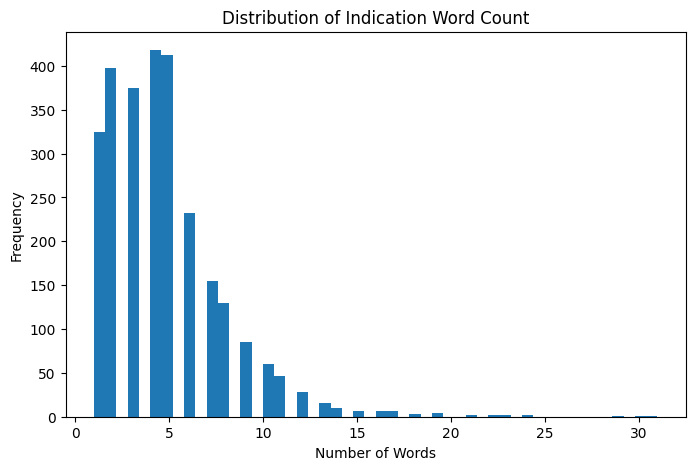

In [19]:
# Distribution of Indication Word Count
reports_clean_df['word_count'] = reports_clean_df['indication'].apply(lambda x: len(str(x).split()))
print("Minimum words in indication:", reports_clean_df['word_count'].min())
print("Maximum words in indication:", reports_clean_df['word_count'].max())
average_words = reports_clean_df['indication'].str.split().str.len().mean()
print(f'Average number of words: {average_words:.0f}')

plt.figure(figsize=(8,5))
plt.hist(reports_clean_df['word_count'], bins=50)
plt.title("Distribution of Indication Word Count")
plt.xlabel("Number of Words")
plt.ylabel("Frequency")
plt.show()

Minimum words in findings: 7
Maximum words in findings: 149
Average number of words: 31


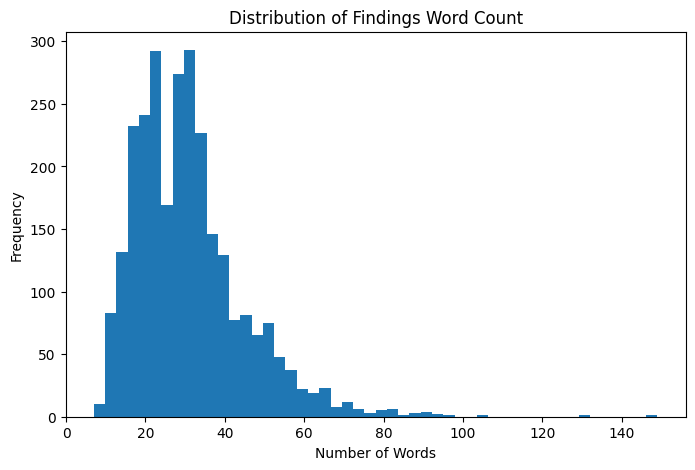

In [20]:
# Distribution of Findings Word Count
reports_clean_df['word_count'] = reports_clean_df['findings'].apply(lambda x: len(str(x).split()))
print("Minimum words in findings:", reports_clean_df['word_count'].min())
print("Maximum words in findings:", reports_clean_df['word_count'].max())
average_words = reports_clean_df['findings'].str.split().str.len().mean()
print(f'Average number of words: {average_words:.0f}')

plt.figure(figsize=(8,5))
plt.hist(reports_clean_df['word_count'], bins=50)
plt.title("Distribution of Findings Word Count")
plt.xlabel("Number of Words")
plt.ylabel("Frequency")
plt.show()

Minimum words in impression: 1
Maximum words in impression: 119
Average number of words: 8


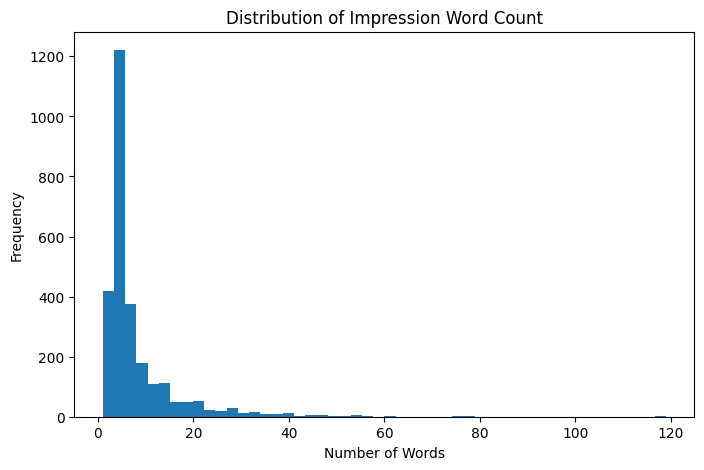

In [21]:
# Distribution of Impression Word Count
reports_clean_df['word_count'] = reports_clean_df['impression'].apply(lambda x: len(str(x).split()))
print("Minimum words in impression:", reports_clean_df['word_count'].min())
print("Maximum words in impression:", reports_clean_df['word_count'].max())
average_words = reports_clean_df['impression'].str.split().str.len().mean()
print(f'Average number of words: {average_words:.0f}')

plt.figure(figsize=(8,5))
plt.hist(reports_clean_df['word_count'], bins=50)
plt.title("Distribution of Impression Word Count")
plt.xlabel("Number of Words")
plt.ylabel("Frequency")
plt.show()

In [22]:
# Combined Report (Findings + Impression)
reports_clean_df["report"] = (
    "<bos> "
    "<Findings> "
    + reports_clean_df["findings"]
    + " "
    "<Impression> "
    + reports_clean_df["impression"]
    + " "
    "<eos>"
)

print("Combined report created.")
reports_clean_df = reports_clean_df.drop(columns=['word_count'])
display(reports_clean_df.head())

Combined report created.


,uid,frontal_projection,lateral_projection,indication,findings,impression,MeSH,Problems,report
0,1,1_IM-0001-4001.dcm.png,1_IM-0001-3001.dcm.png,positive tb test,the cardiac silhouette and mediastinum size ar...,normal chest x-xxxx.,normal,normal,<bos> <Findings> the cardiac silhouette and me...
1,2,2_IM-0652-1001.dcm.png,2_IM-0652-2001.dcm.png,preop bariatric surgery.,borderline cardiomegaly. midline sternotomy xx...,no acute pulmonary findings.,cardiomegaly/borderline;pulmonary artery/enlarged,cardiomegaly;pulmonary artery,<bos> <Findings> borderline cardiomegaly. midl...
2,4,4_IM-2050-1001.dcm.png,4_IM-2050-2001.dcm.png,xxxx-year-old xxxx with xxxx.,there are diffuse bilateral interstitial and a...,1. bullous emphysema and interstitial fibrosis...,"pulmonary disease, chronic obstructive;bullous...","pulmonary disease, chronic obstructive;bullous...",<bos> <Findings> there are diffuse bilateral i...
3,5,5_IM-2117-1003002.dcm.png,5_IM-2117-1004003.dcm.png,chest and nasal congestion.,the cardiomediastinal silhouette and pulmonary...,no acute cardiopulmonary abnormality.,osteophyte/thoracic vertebrae/multiple/small;t...,osteophyte;thickening;lung,<bos> <Findings> the cardiomediastinal silhoue...
4,6,6_IM-2192-1001.dcm.png,6_IM-2192-2001.dcm.png,evaluate for infection,heart size and mediastinal contour are within ...,no acute cardiopulmonary findings.,normal,normal,<bos> <Findings> heart size and mediastinal co...


In [23]:
# Load Tokenizers
from transformers import (AutoTokenizer, GPT2Tokenizer)
BERT_MODEL_NAME = "emilyalsentzer/Bio_ClinicalBERT"
GPT2_MODEL_NAME = "gpt2"
bert_tokenizer = AutoTokenizer.from_pretrained(BERT_MODEL_NAME)
gpt2_tokenizer = GPT2Tokenizer.from_pretrained(GPT2_MODEL_NAME, add_prefix_space=True)

print("Tokenizers loaded successfully.")

config.json:   0%|          | 0.00/385 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

Tokenizers loaded successfully.


In [24]:
# GPT2 Special Tokens
SPECIAL_TOKENS = {
    "bos_token": "<bos>",
    "eos_token": "<eos>",
    "pad_token": "<pad>",
    "additional_special_tokens": [
        "<Findings>",
        "<Impression>"
    ]
}

gpt2_tokenizer.add_special_tokens(SPECIAL_TOKENS)

print("GPT2 vocabulary size:")
print(len(gpt2_tokenizer))
print("\nSpecial Tokens:")
print("BOS:", gpt2_tokenizer.bos_token)
print("EOS:", gpt2_tokenizer.eos_token)
print("PAD:", gpt2_tokenizer.pad_token)

GPT2 vocabulary size:
50262

Special Tokens:
BOS: <bos>
EOS: <eos>
PAD: <pad>


In [25]:
# MAX_INDICATION_LENGTH = 64
# MAX_REPORT_LENGTH = 256

In [26]:
# PRETOKENIZE INDICATION
bert_input_ids = []
bert_attention_masks = []

for indication in reports_clean_df["indication"]:
    encoding = bert_tokenizer(
        indication,
        max_length=MAX_INDICATION_LENGTH,
        padding="max_length",
        truncation=True,
        return_tensors="pt"
    )

    bert_input_ids.append(encoding["input_ids"].squeeze(0))
    bert_attention_masks.append(encoding["attention_mask"].squeeze(0))

reports_clean_df["indication_input_ids"] = bert_input_ids
reports_clean_df["indication_attention_mask"] = bert_attention_masks
print("BERT Tokenization Complete")

BERT Tokenization Complete


In [27]:
# PRETOKENIZE REPORTS
report_input_ids = []
report_attention_masks = []

for report in reports_clean_df["report"]:
    encoding = gpt2_tokenizer(
        report,
        max_length=MAX_REPORT_LENGTH,
        padding="max_length",
        truncation=True,
        return_tensors="pt"
    )

    report_input_ids.append(encoding["input_ids"].squeeze(0))
    report_attention_masks.append(encoding["attention_mask"].squeeze(0))

reports_clean_df["report_input_ids"] = report_input_ids
reports_clean_df["report_attention_mask"] = report_attention_masks
print("GPT2 Tokenization Complete")

GPT2 Tokenization Complete


INDICATION TOKEN LENGTH ANALYSIS:


count    2729.000000
mean       13.731403
std         7.586068
min         3.000000
50%        14.000000
75%        18.000000
90%        23.000000
95%        27.000000
99%        36.720000
max        64.000000
dtype: float64


Longest Indication = 64


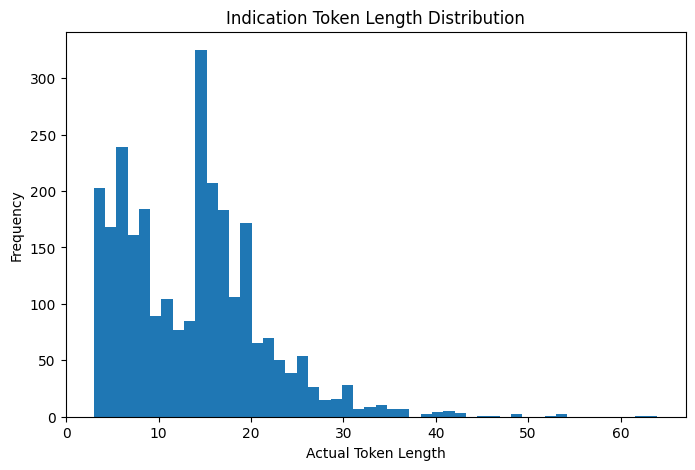



REPORT TOKEN LENGTH ANALYSIS:


count    2729.000000
mean       70.170392
std        29.323693
min        25.000000
50%        64.000000
75%        82.000000
90%       109.000000
95%       128.600000
99%       172.000000
max       256.000000
dtype: float64


Longest Report = 256


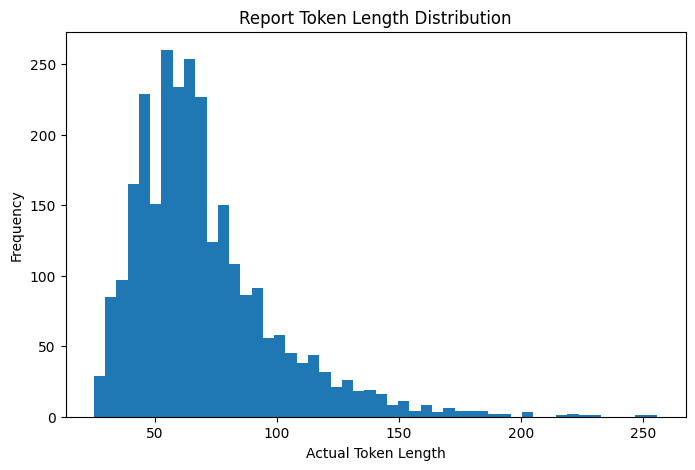

In [28]:
# TOKEN LENGTH ANALYSIS AFTER PRETOKENIZATION

# ACTUAL INDICATION LENGTHS
indication_lengths = [
    int(mask.sum().item())
    for mask in reports_clean_df["indication_attention_mask"]
]

# ACTUAL REPORT LENGTHS
report_lengths = [
    int(mask.sum().item())
    for mask in reports_clean_df["report_attention_mask"]
]

# INDICATION ANALYSIS
print("INDICATION TOKEN LENGTH ANALYSIS:")
display(pd.Series(indication_lengths).describe(percentiles=[0.50, 0.75, 0.90, 0.95, 0.99]))

# print(f"\nMAX_INDICATION_LENGTH = {MAX_INDICATION_LENGTH}")
print(f"\nLongest Indication = {max(indication_lengths)}")
plt.figure(figsize=(8,5))
plt.hist(indication_lengths, bins=50)
plt.title("Indication Token Length Distribution")
plt.xlabel("Actual Token Length")
plt.ylabel("Frequency")
plt.show()

# REPORT ANALYSIS
print("\n")
print("REPORT TOKEN LENGTH ANALYSIS:")
display(pd.Series(report_lengths).describe(percentiles=[0.50, 0.75, 0.90, 0.95, 0.99]))

# print(f"\nMAX_REPORT_LENGTH = {MAX_REPORT_LENGTH}")
print(f"\nLongest Report = {max(report_lengths)}")
plt.figure(figsize=(8,5))
plt.hist(report_lengths, bins=50)
plt.title("Report Token Length Distribution")
plt.xlabel("Actual Token Length")
plt.ylabel("Frequency")
plt.show()

In [29]:
# PADDING ANALYSIS
print("PADDING ANALYSIS:")
avg_indication = np.mean(indication_lengths)
avg_report = np.mean(report_lengths)

print(f"Average Indication Length: {avg_indication:.2f}")
print(f"Average Report Length: {avg_report:.2f}")
print(f"Indication Padding Waste: {100*(1-avg_indication/MAX_INDICATION_LENGTH):.2f}%")
print(f"Report Padding Waste: {100*(1-avg_report/MAX_REPORT_LENGTH):.2f}%")

PADDING ANALYSIS:
Average Indication Length: 13.73
Average Report Length: 70.17
Indication Padding Waste: 78.54%
Report Padding Waste: 72.59%


In [30]:
# Splits GPT2 report into Findings and Impression.
def split_generated_report(report_text):
    if report_text is None:
        return "", ""

    report_text = str(report_text)

    # Remove common special tokens first
    report_text = (report_text.replace("<bos>", "").replace("<eos>", "").replace("<pad>", "").strip())

    findings = ""
    impression = ""

    # Findings + Impression both present
    if ("<Findings>" in report_text and "<Impression>" in report_text):
        findings = (report_text.split("<Findings>", 1)[1].split("<Impression>", 1)[0].strip())
        impression = (report_text.split("<Impression>", 1)[1].strip())

    # Findings present, Impression missing
    elif "<Findings>" in report_text:
        findings = (report_text.split("<Findings>", 1)[1].strip())
        impression = ""

    # Impression present, Findings missing
    elif "<Impression>" in report_text:
        findings = ""
        impression = (report_text.split("<Impression>", 1)[1].strip())

    # No special tokens generated
    else:
        findings = report_text
        impression = ""

    return findings, impression

In [31]:
# IMAGE PROCESSING
# DenseNet-121 Transform Pipeline
from torchvision import transforms

# ImageNet Normalization Parameters
IMAGE_SIZE = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

image_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=IMAGENET_MEAN,
        std=IMAGENET_STD
    )
])

# # Image Loading Function
# def load_and_transform_image(image_path):
#     image = Image.open(image_path)
#     image = image.convert("RGB")
#     transformed_image = image_transform(image)
#     return image, transformed_image

print("Image Transforms Defined.")

Image Transforms Defined.


In [32]:
# PREPROCESS ALL IMAGES ONCE
image_cache = {}

all_images = set(reports_clean_df["frontal_projection"]).union(set(reports_clean_df["lateral_projection"]))
for image_name in tqdm(all_images, desc="Processing Images"):
    image_path = os.path.join(IMAGES_PATH, image_name)
    image = (Image.open(image_path).convert("RGB"))
    image = image_transform(image)
    image_cache[image_name] = image

print("Processed Images:", len(image_cache))

Processing Images:   0%|          | 0/5458 [00:00<?, ?it/s]

Processed Images: 5458


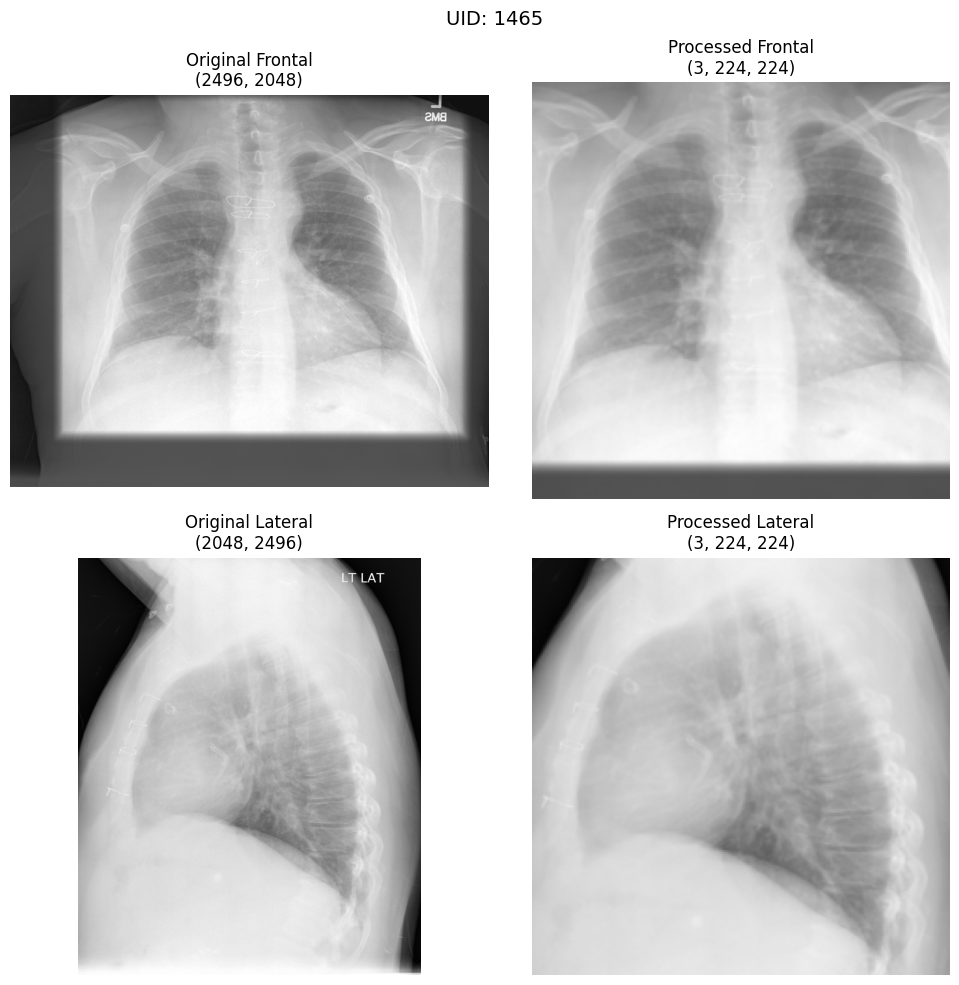

In [33]:
# IMAGE PREPROCESSING VISUALIZATION

# DENORMALIZATION FUNCTION
def denormalize_image(tensor):
    tensor = tensor.clone()
    for c in range(3):
        tensor[c] = (tensor[c] * IMAGENET_STD[c] + IMAGENET_MEAN[c])

    tensor = torch.clamp(tensor, min=0.0, max=1.0)
    return tensor


# NUMBER OF PATIENTS TO DISPLAY
NUM_SAMPLES = 1

sample_rows = reports_clean_df.sample(n=NUM_SAMPLES, random_state=SEED)

# VISUALIZE
for _, row in sample_rows.iterrows():
    uid = row["uid"]
    frontal_name = row["frontal_projection"]
    lateral_name = row["lateral_projection"]
    frontal_path = os.path.join(IMAGES_PATH, frontal_name)
    lateral_path = os.path.join(IMAGES_PATH, lateral_name)

    # LOAD ORIGINAL IMAGES
    frontal_original = (Image.open(frontal_path).convert("RGB"))
    lateral_original = (Image.open(lateral_path).convert("RGB"))

    # APPLY TRANSFORMS
    frontal_tensor = image_transform(frontal_original)
    lateral_tensor = image_transform(lateral_original)

    # DENORMALIZE FOR DISPLAY
    frontal_processed = (denormalize_image(frontal_tensor).permute(1, 2, 0).cpu().numpy())
    lateral_processed = (denormalize_image(lateral_tensor).permute(1, 2, 0).cpu().numpy())

    # DISPLAY
    fig, axes = plt.subplots(2, 2, figsize=(10,10))

    # ORIGINAL FRONTAL
    axes[0,0].imshow(frontal_original)
    axes[0,0].set_title(f"Original Frontal\n{frontal_original.size}")
    axes[0,0].axis("off")

    # PROCESSED FRONTAL
    axes[0,1].imshow(frontal_processed)
    axes[0,1].set_title(f"Processed Frontal\n{tuple(frontal_tensor.shape)}")
    axes[0,1].axis("off")

    # ORIGINAL LATERAL
    axes[1,0].imshow(lateral_original)
    axes[1,0].set_title(f"Original Lateral\n{lateral_original.size}")
    axes[1,0].axis("off")

    # PROCESSED LATERAL
    axes[1,1].imshow(lateral_processed)
    axes[1,1].set_title(f"Processed Lateral\n{tuple(lateral_tensor.shape)}")
    axes[1,1].axis("off")
    
    plt.suptitle(f"UID: {uid}", fontsize=14)
    plt.tight_layout()
    plt.show()

In [34]:
# plt.figure(figsize=(5,5))
# plt.imshow(frontal_tensor.permute(1,2,0).cpu().numpy())
# plt.title("Normalized Tensor (DenseNet Input)")
# plt.axis("off")
# plt.show()

In [35]:
from torch.utils.data import Dataset

class RadiologyDataset(Dataset):
    def __init__(self, dataframe, image_cache):
        self.df = (dataframe.reset_index(drop=True))
        self.image_cache = image_cache

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        return {
            # RAW DATA
            "uid": row["uid"],
            "frontal_projection": row["frontal_projection"],
            "lateral_projection": row["lateral_projection"],
            "indication": row["indication"],
            "findings": row["findings"],
            "impression": row["impression"],
            "MeSH": row["MeSH"],
            "Problems": row["Problems"],
            "report": row["report"],

            # IMAGES
            "frontal_image": self.image_cache[row["frontal_projection"]],
            "lateral_image": self.image_cache[row["lateral_projection"]],

            # BERT TOKENS
            "indication_input_ids": row["indication_input_ids"],
            "indication_attention_mask": row["indication_attention_mask"],

            # GPT2 TOKENS
            "report_input_ids": row["report_input_ids"],
            "report_attention_mask": row["report_attention_mask"]
        }


radiology_dataset = RadiologyDataset(dataframe=reports_clean_df, image_cache=image_cache)
print("Dataset Created Successfully")

Dataset Created Successfully


In [36]:
# Dataset Statistics
print("DATASET INFORMATION:")
print("Total Reports:", len(radiology_dataset))
print("Total Images:", len(image_cache))
print("\n")
print("SAMPLE DATASET RECORD:")
sample = radiology_dataset[0]
print("Keys in sample:", sample.keys())
print("\nUID:", sample["uid"])
print("Frontal Image Shape:", sample["frontal_image"].shape)
print("Lateral Image Shape:", sample["lateral_image"].shape)
print("Indication Input IDs Shape:", sample["indication_input_ids"].shape)
print("Indication Attention Mask Shape:", sample["indication_attention_mask"].shape)
print("Report Input IDs Shape:", sample["report_input_ids"].shape)
print("Report Attention Mask Shape:", sample["report_attention_mask"].shape)

DATASET INFORMATION:
Total Reports: 2729
Total Images: 5458


SAMPLE DATASET RECORD:
Keys in sample: dict_keys(['uid', 'frontal_projection', 'lateral_projection', 'indication', 'findings', 'impression', 'MeSH', 'Problems', 'report', 'frontal_image', 'lateral_image', 'indication_input_ids', 'indication_attention_mask', 'report_input_ids', 'report_attention_mask'])

UID: 1
Frontal Image Shape: torch.Size([3, 224, 224])
Lateral Image Shape: torch.Size([3, 224, 224])
Indication Input IDs Shape: torch.Size([64])
Indication Attention Mask Shape: torch.Size([64])
Report Input IDs Shape: torch.Size([256])
Report Attention Mask Shape: torch.Size([256])


In [37]:
# DATA SPLITTING
# Training(70) / Validation(15) / Testing(15) Split
from sklearn.model_selection import train_test_split

train_df, temp_df = train_test_split(
    reports_clean_df,
    test_size=0.30,
    random_state=SEED,
    shuffle=True
)

val_df, test_df = train_test_split(
    temp_df,
    test_size=0.50,
    random_state=SEED,
    shuffle=True
)

print("DATASET SPLITS:")

print(f"Training Size   : {len(train_df)} ({100*len(train_df)/len(reports_clean_df):.2f}%)")
print(f"Validation Size :  {len(val_df)} ({100*len(val_df)/len(reports_clean_df):.2f}%)")
print(f"Testing Size    :  {len(test_df)} ({100*len(test_df)/len(reports_clean_df):.2f}%)")

DATASET SPLITS:
Training Size   : 1910 (69.99%)
Validation Size :  409 (14.99%)
Testing Size    :  410 (15.02%)


In [38]:
# DATASET OBJECTS
train_dataset = RadiologyDataset(dataframe=train_df, image_cache=image_cache)
val_dataset = RadiologyDataset(dataframe=val_df, image_cache=image_cache)
test_dataset = RadiologyDataset(dataframe=test_df, image_cache=image_cache)
print("Dataset objects created.")

Dataset objects created.


In [39]:
# DataLoaders
# BATCH_SIZE = 4

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    pin_memory=True
)

print("DataLoaders created.")

DataLoaders created.


In [40]:
# Batch Verification
print("DATASET OBJECT SIZES:")
print("Train Dataset:", len(train_dataset))
print("Validation Dataset:", len(val_dataset))
print("Test Dataset:", len(test_dataset))
print("\n")
print("DATALOADER INFORMATION:")
print("Batch Size:", BATCH_SIZE)
print("Train Batches:", len(train_loader))
print("Validation Batches:", len(val_loader))
print("Test Batches:", len(test_loader))
print("\n")
batch = next(iter(train_loader))
print("BATCH SHAPES:")
print("Number of UIDs:", len(batch["uid"]))
print("Frontal Images:", batch["frontal_image"].shape)
print("Lateral Images:", batch["lateral_image"].shape)
print("Indication Input IDs:", batch["indication_input_ids"].shape)
print("Indication Attention Mask:", batch["indication_attention_mask"].shape)
print("Report Input IDs:", batch["report_input_ids"].shape)
print("Report Attention Mask:", batch["report_attention_mask"].shape)

DATASET OBJECT SIZES:
Train Dataset: 1910
Validation Dataset: 409
Test Dataset: 410


DATALOADER INFORMATION:
Batch Size: 8
Train Batches: 239
Validation Batches: 52
Test Batches: 52


BATCH SHAPES:
Number of UIDs: 8
Frontal Images: torch.Size([8, 3, 224, 224])
Lateral Images: torch.Size([8, 3, 224, 224])
Indication Input IDs: torch.Size([8, 64])
Indication Attention Mask: torch.Size([8, 64])
Report Input IDs: torch.Size([8, 256])
Report Attention Mask: torch.Size([8, 256])


In [41]:
# MODEL BUILDING
# Load Pretrained DenseNet121

from torchvision.models import (densenet121, DenseNet121_Weights)

densenet = densenet121(weights=DenseNet121_Weights.IMAGENET1K_V1)
print("DenseNet121 Loaded Successfully")

print("\nOriginal Classifier:")
print(densenet.classifier)

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


100%|██████████| 30.8M/30.8M [00:00<00:00, 157MB/s] 

DenseNet121 Loaded Successfully

Original Classifier:
Linear(in_features=1024, out_features=1000, bias=True)


In [42]:
# IMAGE ENCODER
class ImageEncoder(nn.Module):
    def __init__(self, output_dim=768, dropout=DROPOUT):
        super().__init__()
        densenet = models.densenet121(weights=models.DenseNet121_Weights.DEFAULT)
        self.backbone = densenet.features
        # Freeze Everything
        for param in self.backbone.parameters():
            param.requires_grad = False
        # Projection Head
        self.projection = nn.Sequential(
            nn.Linear(1024, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(1024, output_dim)
        )

    # Encode Single Image
    def encode_image(self, image):
        features = self.backbone(image)
        features = F.relu(features, inplace=True)
        features = F.adaptive_avg_pool2d(features, (1, 1))
        features = torch.flatten(features, 1)
        features = self.projection(features)
        return features

    # Forward
    def forward(self, frontal_image, lateral_image):
        frontal_features = (self.encode_image(frontal_image))
        lateral_features = (self.encode_image(lateral_image))
        return (frontal_features, lateral_features)
        

# INSTANTIATE IMAGE ENCODER
image_encoder = ImageEncoder(output_dim=768, dropout=DROPOUT).to(device)
# print(image_encoder)

In [43]:
# Parameter Statistics
total_params = sum(
    p.numel()
    for p in image_encoder.parameters()
)

trainable_params = sum(
    p.numel()
    for p in image_encoder.parameters()
    if p.requires_grad
)

frozen_params = (total_params - trainable_params)

print("IMAGE ENCODER PARAMETERS:")

print(f"Total Parameters     : {total_params:,}")
print(f"Trainable Parameters : {trainable_params:,}")
print(f"Frozen Parameters    : {frozen_params:,}")

IMAGE ENCODER PARAMETERS:
Total Parameters     : 8,792,704
Trainable Parameters : 1,838,848
Frozen Parameters    : 6,953,856


In [44]:
# Forward Pass Test
batch = next(iter(train_loader))

frontal_images = (batch["frontal_image"].to(device))
lateral_images = (batch["lateral_image"].to(device))

with torch.no_grad():
    frontal_features, lateral_features = (image_encoder(frontal_images, lateral_images))

print("IMAGE ENCODER OUTPUT SHAPES:")
print("Frontal Features:", frontal_features.shape)
print("Lateral Features:", lateral_features.shape)

IMAGE ENCODER OUTPUT SHAPES:
Frontal Features: torch.Size([8, 768])
Lateral Features: torch.Size([8, 768])


In [45]:
# MODEL BUILDING
# Load BioClinicalBERT
from transformers import AutoModel

BERT_MODEL_NAME = "emilyalsentzer/Bio_ClinicalBERT"

clinical_bert = AutoModel.from_pretrained(BERT_MODEL_NAME)

print("BioClinicalBERT Loaded Successfully")
print("\nHidden Size:", clinical_bert.config.hidden_size)

pytorch_model.bin:   0%|          | 0.00/436M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BioClinicalBERT Loaded Successfully

Hidden Size: 768


In [46]:
# INDICATION ENCODER
class IndicationEncoder(nn.Module):
    def __init__(self, output_dim=768, dropout=DROPOUT):
        super().__init__()
        self.bert = AutoModel.from_pretrained(BERT_MODEL_NAME)
        # Freeze BERT
        for param in self.bert.parameters():
            param.requires_grad = False
        # Projection Head
        self.projection = nn.Sequential(
            nn.Linear(768, 768),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(768, output_dim)
        )

    def forward(self, input_ids, attention_mask):
        outputs = self.bert(
            input_ids=input_ids,
            attention_mask=attention_mask
        )
        cls_embedding = (outputs.last_hidden_state[:, 0, :])
        indication_features = (self.projection(cls_embedding))
        return indication_features


# INSTANTIATE INDICATION ENCODER
indication_encoder = IndicationEncoder(output_dim=768, dropout=DROPOUT).to(device)
# print(indication_encoder)

model.safetensors:   0%|          | 0.00/436M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

In [47]:
# Parameter Statistics
total_params = sum(
    p.numel()
    for p in indication_encoder.parameters()
)

trainable_params = sum(
    p.numel()
    for p in indication_encoder.parameters()
    if p.requires_grad
)

frozen_params = (total_params - trainable_params)

print("INDICATION ENCODER PARAMETERS:")
print(f"Total Parameters     : {total_params:,}")
print(f"Trainable Parameters : {trainable_params:,}")
print(f"Frozen Parameters    : {frozen_params:,}")

INDICATION ENCODER PARAMETERS:
Total Parameters     : 109,491,456
Trainable Parameters : 1,181,184
Frozen Parameters    : 108,310,272


In [48]:
# Forward Pass Test
batch = next(iter(train_loader))

indication_input_ids = (batch["indication_input_ids"].to(device))
indication_attention_mask = (batch["indication_attention_mask"].to(device))

with torch.no_grad():
    indication_features = (indication_encoder(indication_input_ids, indication_attention_mask))

print("INDICATION ENCODER OUTPUT:")
print("Feature Shape:", indication_features.shape)

INDICATION ENCODER OUTPUT:
Feature Shape: torch.Size([8, 768])


In [49]:
# FUSION MODULE
class FusionModule(nn.Module):
    def __init__(self, hidden_dim=768, dropout=DROPOUT):
        super().__init__()
        self.frontal_fusion = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(dropout)
        )

        self.lateral_fusion = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(dropout)
        )

        self.indication_fusion = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(dropout)
        )

    def forward(self, frontal_features, lateral_features, indication_features):
        frontal_features = (self.frontal_fusion(frontal_features))
        lateral_features = (self.lateral_fusion(lateral_features))
        indication_features = (self.indication_fusion(indication_features))
        frontal_features = (frontal_features.unsqueeze(1))
        lateral_features = (lateral_features.unsqueeze(1))
        indication_features = (indication_features.unsqueeze(1))
        fused_prefix = torch.cat([frontal_features, lateral_features, indication_features], dim=1)
        return fused_prefix


# INSTANTIATE FUSION MODULE
fusion_module = FusionModule(hidden_dim=768, dropout=DROPOUT).to(device)
# print(fusion_module)

In [50]:
# Fusion Module Forward Pass
batch = next(iter(train_loader))

# Frontal and Lateral Images
frontal_images = (batch["frontal_image"].to(device))
lateral_images = (batch["lateral_image"].to(device))

# Indication Text
indication_input_ids = (batch["indication_input_ids"].to(device))
indication_attention_mask = (batch["indication_attention_mask"].to(device))

# Forward Pass
with torch.no_grad():
    frontal_features, lateral_features = (image_encoder(frontal_images, lateral_images))

    indication_features = (indication_encoder(indication_input_ids, indication_attention_mask))

    fused_prefix = (fusion_module(frontal_features, lateral_features, indication_features))

print("FUSION MODULE INPUT:")
print("Frontal Features:", frontal_features.shape)
print("Lateral Features:", lateral_features.shape)
print("Indication Features:", indication_features.shape)
print("\n")
print("FUSION MODULE OUTPUT:")
print("Fused Prefix Shape:", fused_prefix.shape)

FUSION MODULE INPUT:
Frontal Features: torch.Size([8, 768])
Lateral Features: torch.Size([8, 768])
Indication Features: torch.Size([8, 768])


FUSION MODULE OUTPUT:
Fused Prefix Shape: torch.Size([8, 3, 768])


In [51]:
# MODEL BUILDING
# Load GPT2
from transformers import GPT2LMHeadModel

GPT2_MODEL_NAME = "gpt2"
gpt2 = GPT2LMHeadModel.from_pretrained(GPT2_MODEL_NAME)
print("GPT2 Loaded Successfully")

print(f"\nHidden Size: {gpt2.config.n_embd}")
print(f"Vocabulary Size: {gpt2.config.vocab_size}")

config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/148 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

GPT2 Loaded Successfully

Hidden Size: 768
Vocabulary Size: 50257


In [52]:
# GPT2
class GPT2Decoder(nn.Module):
    def __init__(self, gpt2_tokenizer, freeze_backbone=True):
        super().__init__()

        # GPT2
        self.gpt2 = GPT2LMHeadModel.from_pretrained(GPT2_MODEL_NAME)

        # Resize Vocabulary because we added: <bos>, <eos>, <pad>, <Findings>, <Impression>
        self.gpt2.resize_token_embeddings(len(gpt2_tokenizer))

        # Freeze GPT2
        if freeze_backbone:
            for param in self.gpt2.parameters():
                param.requires_grad = False
          
            for block in self.gpt2.transformer.h[-4:]: # 2, 4
                for param in block.parameters():
                    param.requires_grad = True
            
            for param in self.gpt2.lm_head.parameters():
                param.requires_grad = True


    # Forward
    def forward(self, fused_prefix, report_input_ids, report_attention_mask):
        batch_size = (report_input_ids.size(0))
        prefix_length = (fused_prefix.size(1))

        # GPT2 Token Embeddings
        report_embeddings = (self.gpt2.transformer.wte(report_input_ids))

        # [B, report_len, 768]

        # Prefix + Report Embeddings
        inputs_embeds = torch.cat([fused_prefix, report_embeddings], dim=1)

        # Prefix Attention Mask
        prefix_attention_mask = torch.ones(batch_size,prefix_length,dtype=torch.long,device=report_input_ids.device)

        attention_mask = torch.cat([prefix_attention_mask, report_attention_mask], dim=1)

        # Labels
        labels = report_input_ids.clone()

        # Ignore padding tokens
        labels[labels == gpt2_tokenizer.pad_token_id] = -100

        # Prefix Labels
        # GPT2 should NOT compute loss on multimodal prefix tokens
        prefix_labels = torch.full((batch_size, prefix_length), -100, dtype=torch.long, device=report_input_ids.device)

        labels = torch.cat([prefix_labels, labels], dim=1)

        # GPT2 Forward
        outputs = self.gpt2(inputs_embeds=inputs_embeds, attention_mask=attention_mask, labels=labels, return_dict=True)

        return outputs


# Instantiate GPT2 Decoder
gpt2_decoder = GPT2Decoder(gpt2_tokenizer=gpt2_tokenizer,freeze_backbone=True)
gpt2_decoder = gpt2_decoder.to(device)
# print(gpt2_decoder)

Loading weights:   0%|          | 0/148 [00:00<?, ?it/s]

In [53]:
# Parameter Statistics
total_params = sum(
    p.numel()
    for p in gpt2_decoder.parameters()
)

trainable_params = sum(
    p.numel()
    for p in gpt2_decoder.parameters()
    if p.requires_grad
)

frozen_params = (total_params - trainable_params)

print("GPT2 DECODER PARAMETERS:")
print(f"Total Parameters     : {total_params:,}")
print(f"Trainable Parameters :  {trainable_params:,}")
print(f"Frozen Parameters    :  {frozen_params:,}")

GPT2 DECODER PARAMETERS:
Total Parameters     : 124,443,648
Trainable Parameters :  66,952,704
Frozen Parameters    :  57,490,944


In [54]:
# Decoder Test
batch = next(iter(train_loader))

frontal_images = (batch["frontal_image"].to(device))
lateral_images = (batch["lateral_image"].to(device))

indication_ids = (batch["indication_input_ids"].to(device))
indication_mask = (batch["indication_attention_mask"].to(device))

report_ids = (batch["report_input_ids"].to(device))
report_mask = (batch["report_attention_mask"].to(device))

with torch.no_grad():
    frontal_features, lateral_features = (image_encoder(frontal_images, lateral_images))

    indication_features = (indication_encoder(indication_ids, indication_mask))

    fused_prefix = (fusion_module(frontal_features, lateral_features, indication_features))

    outputs = gpt2_decoder(fused_prefix, report_ids, report_mask)

print("GPT2 OUTPUT:")
print("Loss:", outputs.loss.item())
print("Logits Shape:", outputs.logits.shape)

GPT2 OUTPUT:
Loss: 5.262726783752441
Logits Shape: torch.Size([8, 259, 50262])


In [55]:
# MODEL BUILDING
# COMPLETE MODEL
class VisionSupervisedRadiologyReportGenerator(nn.Module):
    def __init__(self):
        super().__init__()
        # Image Encoder
        self.image_encoder = ImageEncoder(output_dim=768, dropout=DROPOUT)
        # Indication Encoder
        self.indication_encoder = IndicationEncoder(output_dim=768, dropout=DROPOUT)
        # Fusion Module
        self.fusion_module = FusionModule(hidden_dim=768, dropout=DROPOUT)
        # GPT2 Decoder
        self.decoder = GPT2Decoder(gpt2_tokenizer)

    def forward(
        self,
        frontal_image,
        lateral_image,
        indication_input_ids,
        indication_attention_mask,
        report_input_ids,
        report_attention_mask=None
    ):
        # IMAGE ENCODING
        frontal_features, lateral_features = (self.image_encoder(frontal_image, lateral_image))
        # INDICATION ENCODING
        indication_features = (self.indication_encoder(indication_input_ids, indication_attention_mask))
        # FUSION
        fused_prefix = (self.fusion_module(frontal_features, lateral_features, indication_features))
        # DECODER
        outputs = self.decoder(fused_prefix, report_input_ids, report_attention_mask)
        return outputs
        

# Instantiate Model
model = VisionSupervisedRadiologyReportGenerator().to(device)
# print(model)
print("Model Created Successfully")

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/148 [00:00<?, ?it/s]

Model Created Successfully


In [56]:
# Parameter Statistics
total_params = sum(
    p.numel()
    for p in model.parameters()
)

trainable_params = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)

frozen_params = (total_params - trainable_params)

print("MODEL SUMMARY:")
print(f"Total Parameters     : {total_params:,}")
print(f"Trainable Parameters : {trainable_params:,}")
print(f"Frozen Parameters    : {frozen_params:,}")

MODEL SUMMARY:
Total Parameters     : 244,499,584
Trainable Parameters : 71,744,512
Frozen Parameters    : 172,755,072


In [57]:
# End-to-End Forward Pass Test
batch = next(iter(train_loader))

frontal_images = (batch["frontal_image"].to(device))
lateral_images = (batch["lateral_image"].to(device))

indication_ids = (batch["indication_input_ids"].to(device))
indication_mask = (batch["indication_attention_mask"].to(device))

report_ids = (batch["report_input_ids"].to(device))
report_mask = (batch["report_attention_mask"].to(device))

with torch.no_grad():
    outputs = model(
        frontal_image=frontal_images,
        lateral_image=lateral_images,
        indication_input_ids=indication_ids,
        indication_attention_mask=indication_mask,
        report_input_ids=report_ids,
        report_attention_mask=report_mask
    )

print("END-TO-END MODEL TEST:")
print("Loss:", outputs.loss.item())
print("Logits Shape:", outputs.logits.shape)

END-TO-END MODEL TEST:
Loss: 5.241392135620117
Logits Shape: torch.Size([8, 259, 50262])


In [58]:
# Trainable Layers
print("TRAINABLE PARAMETERS:")

for name, param in model.named_parameters():
    if param.requires_grad:
        print(name, param.shape)

TRAINABLE PARAMETERS:
image_encoder.projection.0.weight torch.Size([1024, 1024])
image_encoder.projection.0.bias torch.Size([1024])
image_encoder.projection.1.weight torch.Size([1024])
image_encoder.projection.1.bias torch.Size([1024])
image_encoder.projection.4.weight torch.Size([768, 1024])
image_encoder.projection.4.bias torch.Size([768])
indication_encoder.projection.0.weight torch.Size([768, 768])
indication_encoder.projection.0.bias torch.Size([768])
indication_encoder.projection.3.weight torch.Size([768, 768])
indication_encoder.projection.3.bias torch.Size([768])
fusion_module.frontal_fusion.0.weight torch.Size([768, 768])
fusion_module.frontal_fusion.0.bias torch.Size([768])
fusion_module.lateral_fusion.0.weight torch.Size([768, 768])
fusion_module.lateral_fusion.0.bias torch.Size([768])
fusion_module.indication_fusion.0.weight torch.Size([768, 768])
fusion_module.indication_fusion.0.bias torch.Size([768])
decoder.gpt2.transformer.wte.weight torch.Size([50262, 768])
decoder.gp

In [59]:
# TRAINING CONFIGURATION
# NUM_EPOCHS = 20 # 5, 10, 20, 80
# LEARNING_RATE = 2e-5 # 2e-5 # 1e-4
# WEIGHT_DECAY = 1e-4
# GRADIENT_CLIP_VALUE = 1.0

print("TRAINING CONFIGURATION:")
print(f"Train Samples : {len(train_dataset)}")
print(f"Val Samples   : {len(val_dataset)}")
print(f"Test Samples  : {len(test_dataset)}")

print(f"Device        : {device}")

print(f"Epochs        : {NUM_EPOCHS}")
print(f"Learning Rate : {LEARNING_RATE}")
print(f"Weight Decay  : {WEIGHT_DECAY}")
print(f"Gradient Clip : {GRADIENT_CLIP_VALUE}")

TRAINING CONFIGURATION:
Train Samples : 1910
Val Samples   : 409
Test Samples  : 410
Device        : cuda
Epochs        : 40
Learning Rate : 5e-05
Weight Decay  : 0.001
Gradient Clip : 1.0


In [60]:
# AdamW Optimizer
optimizer = torch.optim.AdamW(
    filter(
        lambda p: p.requires_grad,
        model.parameters()
    ),
    lr=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY
)

print("AdamW Optimizer Created")

AdamW Optimizer Created


In [61]:
# Learning Rate Scheduler
from transformers import get_cosine_schedule_with_warmup

total_training_steps = (len(train_loader) * NUM_EPOCHS)
warmup_steps = int(0.1 * total_training_steps)
scheduler = get_cosine_schedule_with_warmup(
    optimizer,
    num_warmup_steps=warmup_steps,
    num_training_steps=total_training_steps
)

print("LEARNING RATE SCHEDULER:")
print(f"Total Training Steps : {total_training_steps}")
print(f"Warmup Steps         : {warmup_steps}")

LEARNING RATE SCHEDULER:
Total Training Steps : 9560
Warmup Steps         : 956


In [62]:
# Gradient Clipping
def clip_gradients(model):
    torch.nn.utils.clip_grad_norm_(
        model.parameters(),
        max_norm=GRADIENT_CLIP_VALUE
    )

In [63]:
# Save Checkpoint
def save_checkpoint(model, optimizer, scheduler, epoch, train_loss, val_loss, filepath):
    checkpoint = {
        "epoch": epoch,
        "model_state_dict": model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "scheduler_state_dict": scheduler.state_dict(),
        "train_loss": train_loss,
        "val_loss": val_loss
    }

    torch.save(checkpoint, filepath)

In [64]:
# Load Checkpoint
def load_checkpoint(filepath, model, optimizer=None, scheduler=None):
    checkpoint = torch.load(filepath, map_location=device)
    model.load_state_dict(checkpoint["model_state_dict"])

    if optimizer is not None:
        optimizer.load_state_dict(checkpoint["optimizer_state_dict"])

    if scheduler is not None:
        scheduler.load_state_dict(checkpoint["scheduler_state_dict"])

    return checkpoint

In [65]:
# Checkpoint Paths
CHECKPOINT_DIR = "/kaggle/working/checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)
BEST_MODEL_PATH = os.path.join(CHECKPOINT_DIR, "best_model.pth")
FINAL_MODEL_PATH = os.path.join(CHECKPOINT_DIR,"final_model.pth")
print("Checkpoint Directory:", CHECKPOINT_DIR)
print(f"Best Model Path : {BEST_MODEL_PATH}")
print(f"Final Model Path: {FINAL_MODEL_PATH}")

Checkpoint Directory: /kaggle/working/checkpoints
Best Model Path : /kaggle/working/checkpoints/best_model.pth
Final Model Path: /kaggle/working/checkpoints/final_model.pth


In [66]:
# MODEL TRAINING
# Token Accuracy
def compute_token_accuracy(logits, labels, pad_token_id):
    predictions = torch.argmax(logits, dim=-1)
    valid_mask = (labels != pad_token_id)
    correct = ((predictions == labels) & valid_mask)
    accuracy = (correct.sum().float() / valid_mask.sum().float())

    return accuracy.item()

In [67]:
# Train One Epoch
def train_one_epoch(model, dataloader, optimizer, scheduler, device):
    model.train()
    running_loss = 0.0
    running_accuracy = 0.0
    progress_bar = tqdm(dataloader, desc="Training", leave=False)

    for batch in progress_bar:
        optimizer.zero_grad()
        # Move Data To GPU
        frontal_image = (batch["frontal_image"].to(device))
        lateral_image = (batch["lateral_image"].to(device))
        indication_ids = (batch["indication_input_ids"].to(device))
        indication_mask = (batch["indication_attention_mask"].to(device))
        report_ids = (batch["report_input_ids"].to(device))
        report_mask = (batch["report_attention_mask"].to(device))

        # Forward Pass
        outputs = model(
            frontal_image=frontal_image,
            lateral_image=lateral_image,
            indication_input_ids=indication_ids,
            indication_attention_mask=indication_mask,
            report_input_ids=report_ids,
            report_attention_mask=report_mask
        )

        loss = outputs.loss

        # Backpropagation
        loss.backward()
        clip_gradients(model)
        optimizer.step()
        scheduler.step()

        # Accuracy
        prefix_length = 3
        logits = outputs.logits[:, prefix_length:-1, :]
        labels = report_ids[:, 1:]
        accuracy = compute_token_accuracy(logits, labels, gpt2_tokenizer.pad_token_id)
        running_loss += loss.item()
        running_accuracy += accuracy
        progress_bar.set_postfix(loss=f"{loss.item():.4f}", acc=f"{accuracy:.4f}")

    epoch_loss = (running_loss / len(dataloader))

    epoch_accuracy = (running_accuracy / len(dataloader))

    return (epoch_loss, epoch_accuracy)

In [68]:
# Validation
def validate(model, dataloader, device):
    model.eval()
    running_loss = 0.0
    running_accuracy = 0.0

    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Validation", leave=False):

            frontal_image = (batch["frontal_image"].to(device))
            lateral_image = (batch["lateral_image"].to(device))
            indication_ids = (batch["indication_input_ids"].to(device))
            indication_mask = (batch["indication_attention_mask"].to(device))
            report_ids = (batch["report_input_ids"].to(device))
            report_mask = (batch["report_attention_mask"].to(device))

            outputs = model(
                frontal_image=frontal_image,
                lateral_image=lateral_image,
                indication_input_ids=indication_ids,
                indication_attention_mask=indication_mask,
                report_input_ids=report_ids,
                report_attention_mask=report_mask
            )

            loss = outputs.loss
            prefix_length = 3
            logits = outputs.logits[:, prefix_length:-1, :]
            labels = report_ids[:, 1:]

            accuracy = compute_token_accuracy(logits, labels, gpt2_tokenizer.pad_token_id)
            running_loss += loss.item()
            running_accuracy += accuracy

    epoch_loss = (running_loss / len(dataloader))
    epoch_accuracy = (running_accuracy / len(dataloader))

    return (epoch_loss, epoch_accuracy)

In [69]:
# TRAINING LOOP
history = {
    "epoch": [],
    "train_loss": [],
    "val_loss": [],
    "train_accuracy": [],
    "val_accuracy": [],
    "epoch_time": []
}

best_val_loss = float("inf")
patience = 10
epochs_without_improvement = 0
print("STARTING TRAINING:")

for epoch in range(NUM_EPOCHS):
    start_time = time.time()
    print(f"\nEpoch {epoch+1}/{NUM_EPOCHS}")

    # Training
    train_loss, train_acc = (train_one_epoch(model, train_loader, optimizer, scheduler, device))

    # Validation
    val_loss, val_acc = (validate(model, val_loader, device))

    epoch_time = (time.time() - start_time)


    # History
    history["epoch"].append(epoch + 1)
    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)
    history["train_accuracy"].append(train_acc)
    history["val_accuracy"].append(val_acc)
    history["epoch_time"].append(epoch_time)

    # print(f"Train Loss: {train_loss:.4f}")
    # print(f"Val Loss: {val_loss:.4f}")
    # print(f"Train Acc: {train_acc:.4f}")
    # print(f"Val Acc: {val_acc:.4f}")
    # print(f"Time: {epoch_time:.2f}s")
    # print(frontal_images.device)
    # print(indication_ids.device)

    print(f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Time: {epoch_time:.2f}s ")

    # # Save Best Model
    # if val_loss < best_val_loss:
    #     best_val_loss = val_loss
    #     save_checkpoint(
    #         model=model,
    #         optimizer=optimizer,
    #         scheduler=scheduler,
    #         epoch=epoch,
    #         train_loss=train_loss,
    #         val_loss=val_loss,
    #         filepath=BEST_MODEL_PATH
    #     )
    #     print("Best model saved.")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        epochs_without_improvement = 0
        save_checkpoint(
            model=model,
            optimizer=optimizer,
            scheduler=scheduler,
            epoch=epoch,
            train_loss=train_loss,
            val_loss=val_loss,
            filepath=BEST_MODEL_PATH
        )
        print("Best model saved.")

    else:
        epochs_without_improvement += 1


    if epochs_without_improvement >= patience:
        print(f"\nEarly stopping triggered at epoch {epoch+1}")
        break


# Save Final Model
save_checkpoint(
    model=model,
    optimizer=optimizer,
    scheduler=scheduler,
    epoch=NUM_EPOCHS,
    train_loss=train_loss,
    val_loss=val_loss,
    filepath=FINAL_MODEL_PATH
)

print("\nTraining Completed.")
print(f"Best Validation Loss: {best_val_loss:.4f}")

STARTING TRAINING:

Epoch 1/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 4.6634 | Val Loss: 3.0944 | Train Acc: 0.3312 | Val Acc: 0.4884 | Time: 160.76s 
Best model saved.

Epoch 2/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 2.5586 | Val Loss: 1.8584 | Train Acc: 0.5184 | Val Acc: 0.6079 | Time: 171.81s 
Best model saved.

Epoch 3/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 1.7720 | Val Loss: 1.5291 | Train Acc: 0.6225 | Val Acc: 0.6660 | Time: 171.97s 
Best model saved.

Epoch 4/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 1.4871 | Val Loss: 1.3586 | Train Acc: 0.6628 | Val Acc: 0.6924 | Time: 172.19s 
Best model saved.

Epoch 5/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 1.3214 | Val Loss: 1.2699 | Train Acc: 0.6932 | Val Acc: 0.7105 | Time: 172.39s 
Best model saved.

Epoch 6/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 1.2098 | Val Loss: 1.2074 | Train Acc: 0.7122 | Val Acc: 0.7231 | Time: 171.53s 
Best model saved.

Epoch 7/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 1.1294 | Val Loss: 1.1707 | Train Acc: 0.7274 | Val Acc: 0.7320 | Time: 172.26s 
Best model saved.

Epoch 8/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 1.0643 | Val Loss: 1.1426 | Train Acc: 0.7394 | Val Acc: 0.7365 | Time: 171.52s 
Best model saved.

Epoch 9/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 1.0104 | Val Loss: 1.1278 | Train Acc: 0.7486 | Val Acc: 0.7415 | Time: 172.16s 
Best model saved.

Epoch 10/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 0.9651 | Val Loss: 1.1150 | Train Acc: 0.7580 | Val Acc: 0.7461 | Time: 171.35s 
Best model saved.

Epoch 11/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 0.9277 | Val Loss: 1.1025 | Train Acc: 0.7649 | Val Acc: 0.7511 | Time: 172.03s 
Best model saved.

Epoch 12/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 0.8900 | Val Loss: 1.0925 | Train Acc: 0.7711 | Val Acc: 0.7546 | Time: 171.93s 
Best model saved.

Epoch 13/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 0.8492 | Val Loss: 1.0984 | Train Acc: 0.7793 | Val Acc: 0.7566 | Time: 171.40s 

Epoch 14/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 0.8238 | Val Loss: 1.0882 | Train Acc: 0.7828 | Val Acc: 0.7567 | Time: 171.48s 
Best model saved.

Epoch 15/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 0.7955 | Val Loss: 1.0940 | Train Acc: 0.7894 | Val Acc: 0.7607 | Time: 171.90s 

Epoch 16/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 0.7716 | Val Loss: 1.0927 | Train Acc: 0.7935 | Val Acc: 0.7593 | Time: 171.48s 

Epoch 17/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 0.7464 | Val Loss: 1.0972 | Train Acc: 0.7996 | Val Acc: 0.7641 | Time: 171.11s 

Epoch 18/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 0.7277 | Val Loss: 1.1078 | Train Acc: 0.8025 | Val Acc: 0.7620 | Time: 171.88s 

Epoch 19/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 0.7023 | Val Loss: 1.1150 | Train Acc: 0.8074 | Val Acc: 0.7636 | Time: 170.93s 

Epoch 20/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 0.6810 | Val Loss: 1.1179 | Train Acc: 0.8120 | Val Acc: 0.7645 | Time: 171.54s 

Epoch 21/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 0.6661 | Val Loss: 1.1171 | Train Acc: 0.8148 | Val Acc: 0.7644 | Time: 171.98s 

Epoch 22/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 0.6506 | Val Loss: 1.1209 | Train Acc: 0.8189 | Val Acc: 0.7646 | Time: 171.49s 

Epoch 23/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 0.6353 | Val Loss: 1.1370 | Train Acc: 0.8214 | Val Acc: 0.7654 | Time: 171.23s 

Epoch 24/40


Training:   0%|          | 0/239 [00:00<?, ?it/s]

Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Train Loss: 0.6187 | Val Loss: 1.1429 | Train Acc: 0.8259 | Val Acc: 0.7649 | Time: 171.21s 

Early stopping triggered at epoch 24

Training Completed.
Best Validation Loss: 1.0882


In [70]:
# Training History
history_df = pd.DataFrame(history)
display(history_df)
# def highlight_high_scores(row):
#     if row['val_loss'] == best_val_loss:
#         return ['background-color: #d4edda'] * len(row)  # Light green
#     return [''] * len(row)

# history_df.style.apply(highlight_high_scores, axis=1)

,epoch,train_loss,val_loss,train_accuracy,val_accuracy,epoch_time
0,1,4.663415,3.094405,0.331218,0.488427,160.757745
1,2,2.558592,1.858409,0.518444,0.607909,171.810667
2,3,1.771978,1.529114,0.622546,0.666026,171.967427
3,4,1.487080,1.358592,0.662822,0.692421,172.186490
4,5,1.321361,1.269909,0.693184,0.710520,172.391011
5,6,1.209780,1.207396,0.712166,0.723119,171.526606
6,7,1.129399,1.170666,0.727406,0.731983,172.259259
7,8,1.064306,1.142583,0.739382,0.736484,171.521806
8,9,1.010376,1.127800,0.748590,0.741475,172.160736
9,10,0.965076,1.115022,0.757994,0.746064,171.353360


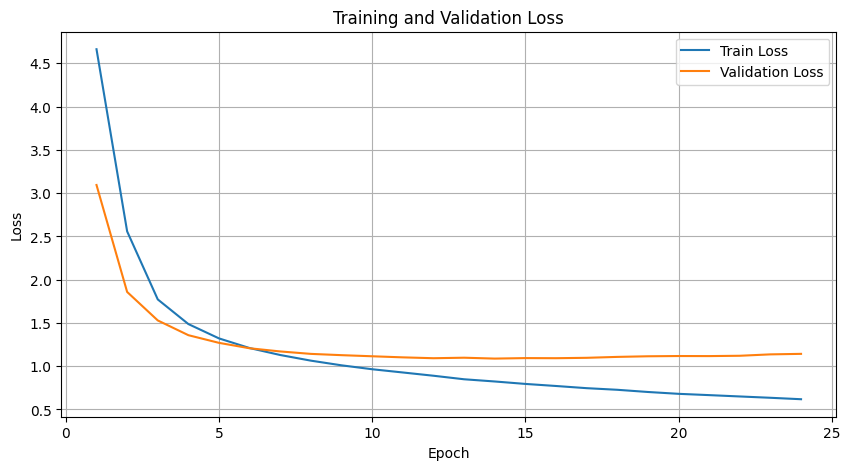

In [71]:
# Loss Curves
plt.figure(figsize=(10,5))
plt.plot(history_df["epoch"], history_df["train_loss"], label="Train Loss")
plt.plot(history_df["epoch"], history_df["val_loss"], label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

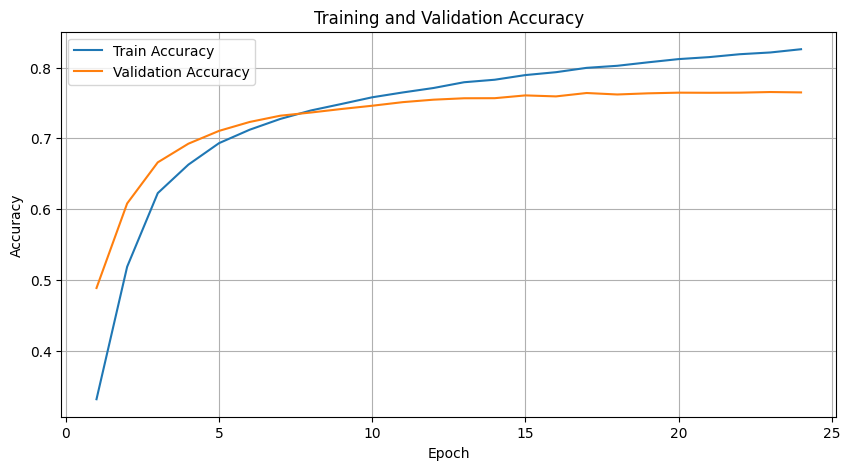

In [72]:
# Accuracy Curves
plt.figure(figsize=(10,5))
plt.plot(history_df["epoch"], history_df["train_accuracy"], label="Train Accuracy")
plt.plot(history_df["epoch"], history_df["val_accuracy"], label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()
plt.grid(True)
plt.show()

In [73]:
# INFERENCE
model = VisionSupervisedRadiologyReportGenerator().to(device)
# Load Best Model
checkpoint = torch.load(BEST_MODEL_PATH, map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])
model = model.to(device)
model.eval()
print("Best model loaded successfully.")

# Load Final Model
# checkpoint = torch.load(FINAL_MODEL_PATH, map_location=device)
# model.load_state_dict(checkpoint["model_state_dict"])
# model.eval()
# print("Final model loaded successfully.")

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/148 [00:00<?, ?it/s]

Best model loaded successfully.


In [74]:
# Report Generation
# MAX_NEW_TOKENS=128 # 128, 256
def generate_report(model, sample, max_new_tokens=MAX_NEW_TOKENS):
    model.eval()
    with torch.no_grad():
        # Inputs
        frontal_image = (sample["frontal_image"].unsqueeze(0).to(device))
        lateral_image = (sample["lateral_image"].unsqueeze(0).to(device))
        indication_ids = (sample["indication_input_ids"].unsqueeze(0).to(device))
        indication_mask = (sample["indication_attention_mask"].unsqueeze(0).to(device))
        # Build Prefix
        frontal_features, lateral_features = (model.image_encoder(frontal_image, lateral_image))
        indication_features = (model.indication_encoder(indication_ids, indication_mask))
        fused_prefix = (model.fusion_module(frontal_features, lateral_features, indication_features))
        # Start Sequence
        generated_ids = torch.tensor([[gpt2_tokenizer.bos_token_id]], device=device)
        # Generation Loop
        for _ in range(max_new_tokens):
            report_embeddings = (model.decoder.gpt2.transformer.wte(generated_ids))
            inputs_embeds = torch.cat([fused_prefix, report_embeddings], dim=1)
            outputs = (model.decoder.gpt2(inputs_embeds=inputs_embeds))
            next_token_logits = (outputs.logits[:, -1, :])
            temperature = 1.0 # 0.8
            top_k = 50 # 20
            
            # repetition_penalty = 1.2
            # for token in generated_ids[0]:
            #     next_token_logits[0, token] /= repetition_penalty
            
            logits = next_token_logits / temperature
            topk_logits, topk_indices = torch.topk(logits,k=top_k)
            probs = torch.softmax(topk_logits, dim=-1)
            sampled = torch.multinomial(probs, 1)
            next_token = torch.gather(topk_indices, -1, sampled)
            generated_ids = torch.cat([generated_ids, next_token], dim=1)
            if (next_token.item()==gpt2_tokenizer.eos_token_id):
                break

        return generated_ids.squeeze(0)

In [75]:
# GRAD-CAM++
from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.image import show_cam_on_image

target_layers = [model.image_encoder.backbone.denseblock4]
cam = GradCAMPlusPlus(model=model.image_encoder, target_layers=target_layers)

class FrontalCAMWrapper(nn.Module):
    def __init__(self, image_encoder):
        super().__init__()
        self.image_encoder = image_encoder

    def forward(self, x):
        features = (self.image_encoder.backbone(x))
        features = F.relu(features, inplace=False)
        features = F.adaptive_avg_pool2d(features, (1,1))
        features = torch.flatten(features, 1)

        return features.mean(dim=1, keepdim=True)


frontal_cam_model = FrontalCAMWrapper(model.image_encoder)
frontal_cam_model.eval()

FrontalCAMWrapper(
  (image_encoder): ImageEncoder(
    (backbone): Sequential(
      (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu0): ReLU(inplace=True)
      (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (denseblock1): _DenseBlock(
        (denselayer1): _DenseLayer(
          (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu1): ReLU(inplace=True)
          (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu2): ReLU(inplace=True)
          (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        )
        (denselayer2): _DenseLayer(
          (norm1): BatchNorm2d(96, eps

In [76]:
def generate_gradcam_heatmap(image_tensor):
    image_tensor = (image_tensor.clone().detach().requires_grad_(True))
    cam = GradCAMPlusPlus(model=frontal_cam_model, target_layers=[frontal_cam_model.image_encoder.backbone.denseblock4])
    grayscale_cam = cam(input_tensor=image_tensor)
    return grayscale_cam[0]

def tensor_to_rgb(tensor):
    img = tensor.detach().cpu()
    img = denormalize_image(img)
    img = img.permute(1, 2, 0).numpy()
    return img


def overlay_heatmap(image_tensor, heatmap):
    rgb_image = tensor_to_rgb(image_tensor)
    visualization = show_cam_on_image(rgb_image, heatmap, use_rgb=True)
    return visualization

In [77]:
# METRIC SETUP
# Evaluation Metrics
import evaluate

from nltk.translate.bleu_score import (
    sentence_bleu,
    SmoothingFunction
)
from nltk.translate.meteor_score import (
    meteor_score
)
from rouge_score import rouge_scorer

from bert_score import BERTScorer

rouge = rouge_scorer.RougeScorer(["rouge1", "rouge2", "rougeL"], use_stemmer=True)
smoothie = SmoothingFunction().method1
bert_scorer = BERTScorer(model_type="distilbert-base-uncased", lang="en", rescale_with_baseline=False)

def compute_all_metrics(reference_report, candidate_report):
    reference_report = str(reference_report)
    candidate_report = str(candidate_report)

    if reference_report.strip() == "":
        reference_report = "empty report"

    if candidate_report.strip() == "":
        candidate_report = "empty report"

    # TOKENIZATION
    ref_tokens = (reference_report.lower().split())
    cand_tokens = (candidate_report.lower().split())

    # BLEU
    bleu1 = sentence_bleu([ref_tokens], cand_tokens, weights=(1,0,0,0), smoothing_function=smoothie)
    bleu2 = sentence_bleu([ref_tokens], cand_tokens, weights=(0.5,0.5,0,0), smoothing_function=smoothie)
    bleu3 = sentence_bleu([ref_tokens], cand_tokens, weights=(1/3,1/3,1/3,0), smoothing_function=smoothie)
    bleu4 = sentence_bleu([ref_tokens], cand_tokens, weights=(0.25,0.25,0.25,0.25), smoothing_function=smoothie)

    # ROUGE
    rouge_scores = rouge.score(reference_report, candidate_report)
    rouge1 = rouge_scores["rouge1"].fmeasure
    rouge2 = rouge_scores["rouge2"].fmeasure
    rougeL = rouge_scores["rougeL"].fmeasure

    # METEOR
    meteor = meteor_score([ref_tokens], cand_tokens)

    # BERTSCORE
    try:
        P, R, F1 = bert_scorer.score([candidate_report], [reference_report])
        
        bert_p = float(P.item())
        bert_r = float(R.item())
        bert_f1 = float(F1.item())

    except Exception as e:
        print("BERTScore Error:", e)
        bert_p = np.nan
        bert_r = np.nan
        bert_f1 = np.nan

    return {
        "BLEU-1": bleu1,
        "BLEU-2": bleu2,
        "BLEU-3": bleu3,
        "BLEU-4": bleu4,
        "ROUGE-1": rouge1,
        "ROUGE-2": rouge2,
        "ROUGE-L": rougeL,
        "METEOR": meteor,
        "PRECISION": bert_p,
        "RECALL": bert_r,
        "F1-SCORE": bert_f1
    }

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

In [78]:
# GENERATE REPORTS AND COMPUTE METRICS
def generate_reports_and_compute_metrics():
    evaluation_rows = []
    model.eval()
    for idx in tqdm(range(len(test_dataset)), desc="Evaluating Test Dataset"):
        sample = test_dataset[idx]

        # GENERATE REPORT
        generated_ids = generate_report(model, sample)
        generated_text = (gpt2_tokenizer.decode(generated_ids, skip_special_tokens=False))
        generated_findings, generated_impression = (split_generated_report(generated_text))

        # REFERENCE REPORT
        reference_report = (sample["findings"] + " " + sample["impression"])
        # GENERATED REPORT
        candidate_report = (generated_findings + " " + generated_impression)

        # METRICS
        metrics = compute_all_metrics(reference_report, candidate_report)

        row = {
            "uid": sample["uid"],
            "frontal_projection": sample["frontal_projection"],
            "lateral_projection": sample["lateral_projection"],
            "indication": sample["indication"],
            "findings": sample["findings"],
            "impression": sample["impression"],
            "MeSH": sample["MeSH"],
            "Problems": sample["Problems"],
            "report": sample["report"],
            "generated_findings": generated_findings,
            "generated_impression": generated_impression
        }

        row.update(metrics)
        evaluation_rows.append(row)

    evaluation_df = pd.DataFrame(evaluation_rows)
    return evaluation_df

In [79]:
NUM_RUNS = 5
all_run_means = []
METRIC_COLUMNS = [
    "BLEU-1",
    "BLEU-2",
    "BLEU-3",
    "BLEU-4",
    "ROUGE-1",
    "ROUGE-2",
    "ROUGE-L",
    "METEOR",
    "PRECISION",
    "RECALL",
    "F1-SCORE"
]
for run_idx in range(NUM_RUNS):
    print(f"\nRun {run_idx+1}/{NUM_RUNS}")
    evaluation_df = (generate_reports_and_compute_metrics())
    run_mean = (evaluation_df[METRIC_COLUMNS].mean())
    all_run_means.append(run_mean)


Run 1/5


Evaluating Test Dataset:   0%|          | 0/410 [00:00<?, ?it/s]


Run 2/5


Evaluating Test Dataset:   0%|          | 0/410 [00:00<?, ?it/s]


Run 3/5


Evaluating Test Dataset:   0%|          | 0/410 [00:00<?, ?it/s]


Run 4/5


Evaluating Test Dataset:   0%|          | 0/410 [00:00<?, ?it/s]


Run 5/5


Evaluating Test Dataset:   0%|          | 0/410 [00:00<?, ?it/s]

In [80]:
runs_df = pd.DataFrame(all_run_means)
display(runs_df)
# Transpose the DataFrame
# runsT_df = runs_df.T
# display(runsT_df)

,BLEU-1,BLEU-2,BLEU-3,BLEU-4,ROUGE-1,ROUGE-2,ROUGE-L,METEOR,PRECISION,RECALL,F1-SCORE
0,0.227422,0.124029,0.070722,0.042589,0.344247,0.116398,0.248930,0.218485,0.846275,0.842341,0.843641
1,0.217732,0.116470,0.066145,0.039067,0.335237,0.113007,0.243391,0.210302,0.846634,0.842690,0.844044
2,0.240057,0.135227,0.080084,0.049491,0.360282,0.134001,0.265311,0.231897,0.850117,0.849421,0.849164
3,0.229807,0.127041,0.073728,0.044023,0.350229,0.120633,0.256466,0.216594,0.848862,0.843482,0.845569
4,0.233167,0.131828,0.078231,0.046368,0.356879,0.129058,0.263765,0.230066,0.850284,0.846057,0.847487


In [81]:
mean_metrics_df = pd.DataFrame({
    "Metric": METRIC_COLUMNS,
    "Mean": runs_df.mean().values,
    "Std": runs_df.std().values
})

mean_metrics_df["Mean ± Std"] = (mean_metrics_df["Mean"].round(4).astype(str) + " ± " + mean_metrics_df["Std"].round(4).astype(str))
# display(mean_metrics_df)
display(mean_metrics_df[["Metric", "Mean ± Std"]])

,Metric,Mean ± Std
0,BLEU-1,0.2296 ± 0.0082
1,BLEU-2,0.1269 ± 0.0073
2,BLEU-3,0.0738 ± 0.0056
3,BLEU-4,0.0443 ± 0.0039
4,ROUGE-1,0.3494 ± 0.01
5,ROUGE-2,0.1226 ± 0.0087
6,ROUGE-L,0.2556 ± 0.0094
7,METEOR,0.2215 ± 0.0092
8,PRECISION,0.8484 ± 0.0019
9,RECALL,0.8448 ± 0.003


In [87]:
ci_rows = []

for metric in runs_df.columns:
    mean = runs_df[metric].mean()
    std = runs_df[metric].std()
    se = std / np.sqrt(5)
    ci = 1.96 * se
    ci_rows.append({
        "Metric": metric,
        "Mean": mean,
        "Std": std,
        "Mean ± Std": f"{mean:.4f} ± {std:.4f}",
        "CI Lower": mean - ci,
        "CI Upper": mean + ci,
        "95% CI": f"[{mean-ci:.4f}, {mean+ci:.4f}]"
    })

confidence_interval_df = pd.DataFrame(ci_rows)
# display(confidence_interval_df)
display(confidence_interval_df[["Metric", "Mean ± Std", "95% CI"]])

,Metric,Mean ± Std,95% CI
0,BLEU-1,0.2296 ± 0.0082,"[0.2225, 0.2368]"
1,BLEU-2,0.1269 ± 0.0073,"[0.1206, 0.1333]"
2,BLEU-3,0.0738 ± 0.0056,"[0.0688, 0.0787]"
3,BLEU-4,0.0443 ± 0.0039,"[0.0409, 0.0477]"
4,ROUGE-1,0.3494 ± 0.0100,"[0.3406, 0.3582]"
5,ROUGE-2,0.1226 ± 0.0087,"[0.1150, 0.1303]"
6,ROUGE-L,0.2556 ± 0.0094,"[0.2473, 0.2638]"
7,METEOR,0.2215 ± 0.0092,"[0.2134, 0.2296]"
8,PRECISION,0.8484 ± 0.0019,"[0.8468, 0.8501]"
9,RECALL,0.8448 ± 0.0030,"[0.8422, 0.8474]"


BEST REPORTS:


,uid,F1-SCORE
0,2842,0.996913
1,3099,0.969153
2,3405,0.932073
3,3266,0.926410
4,1794,0.924613



UID: 2842
F1-SCORE: 0.9969


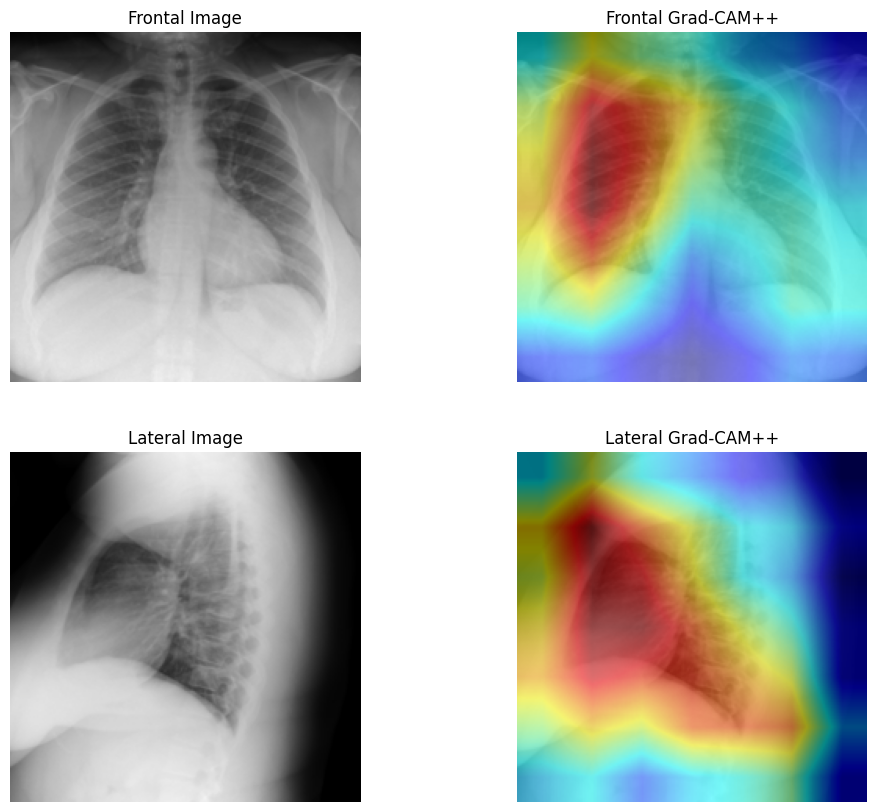


INDICATION:
xxxx-year-old female, preop cholecystectomy, xxxx, history of sarcoidosis..

FINDINGS:
the lungs are clear bilaterally. specifically, no evidence of focal consolidation, pneumothorax, or pleural effusion.. cardio mediastinal silhouette is unremarkable. visualized osseous structures of the thorax are without acute abnormality.

IMPRESSION:
no acute cardiopulmonary abnormality..

GENERATED FINDINGS:
lungs are clear bilaterally. specifically, no evidence of focal consolidation, pneumothorax, or pleural effusion.. cardio mediastinal silhouette is unremarkable. visualized osseous structures of the thorax are without acute abnormality.

GENERATED IMPRESSION:
no acute cardiopulmonary abnormality..

METRICS:
BLEU-1: 0.9702
BLEU-2: 0.9702
BLEU-3: 0.9702
BLEU-4: 0.9702
ROUGE-1: 0.9851
ROUGE-2: 0.9846
ROUGE-L: 0.9851
METEOR: 0.9734
PRECISION: 0.9972
RECALL: 0.9966
F1-SCORE: 0.9969

UID: 3099
F1-SCORE: 0.9692


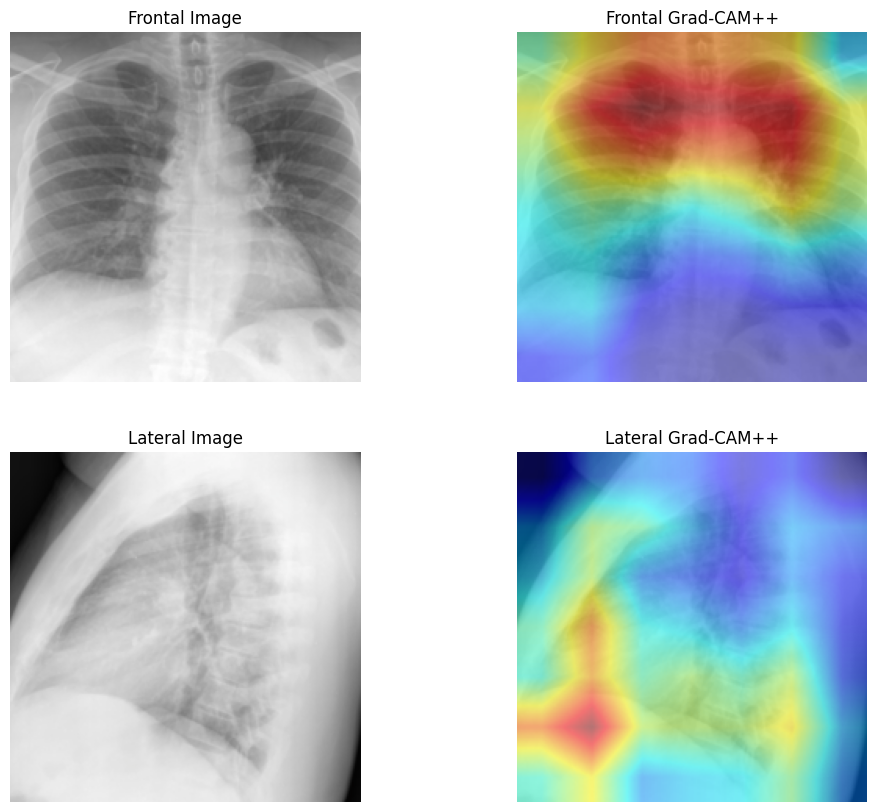


INDICATION:
xxxx-year-old male with xxxx.

FINDINGS:
lungs are clear without focal consolidation, effusion, or pneumothorax. normal heart size. bony thorax and soft tissues grossly unremarkable. calcified left hilar xxxx.

IMPRESSION:
negative for acute cardiopulmonary abnormality.

GENERATED FINDINGS:
lungs are clear without focal consolidation, effusion, or pneumothorax. normal heart size. bony thorax and soft tissues grossly unremarkable

GENERATED IMPRESSION:
negative for acute cardiopulmonary abnormality.

METRICS:
BLEU-1: 0.8112
BLEU-2: 0.7918
BLEU-3: 0.7710
BLEU-4: 0.7486
ROUGE-1: 0.9231
ROUGE-2: 0.8800
ROUGE-L: 0.9231
METEOR: 0.8331
PRECISION: 0.9872
RECALL: 0.9517
F1-SCORE: 0.9692

UID: 3405
F1-SCORE: 0.9321


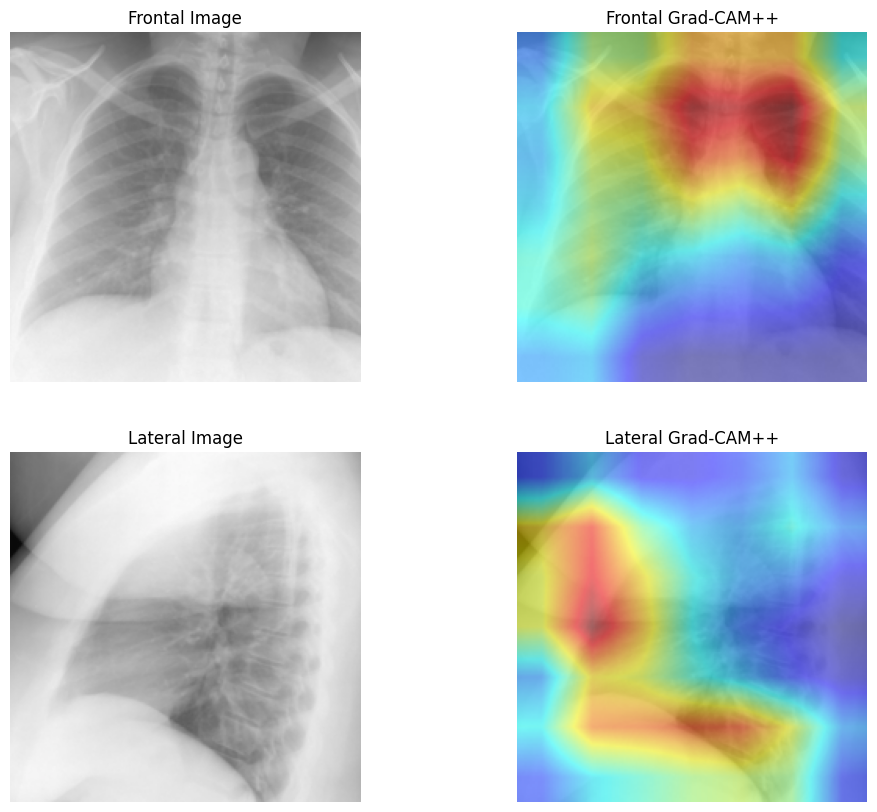


INDICATION:
xxxx-year-old female with chest pain

FINDINGS:
the heart is normal size. the mediastinum is unremarkable. there is no pleural effusion, pneumothorax, or focal airspace disease. mild degenerative changes are present within the spine.

IMPRESSION:
no acute cardiopulmonary abnormality.

GENERATED FINDINGS:
the cardiomediastinal silhouette is normal in size and contour. there is no focal consolidation, pneumothorax, or large pleural effusion. there are mild chronic degenerative changes of the spine.

GENERATED IMPRESSION:
no acute cardiopulmonary abnormalities.

METRICS:
BLEU-1: 0.5938
BLEU-2: 0.4152
BLEU-3: 0.2843
BLEU-4: 0.1995
ROUGE-1: 0.6984
ROUGE-2: 0.3607
ROUGE-L: 0.5714
METEOR: 0.5340
PRECISION: 0.9327
RECALL: 0.9314
F1-SCORE: 0.9321

UID: 3266
F1-SCORE: 0.9264


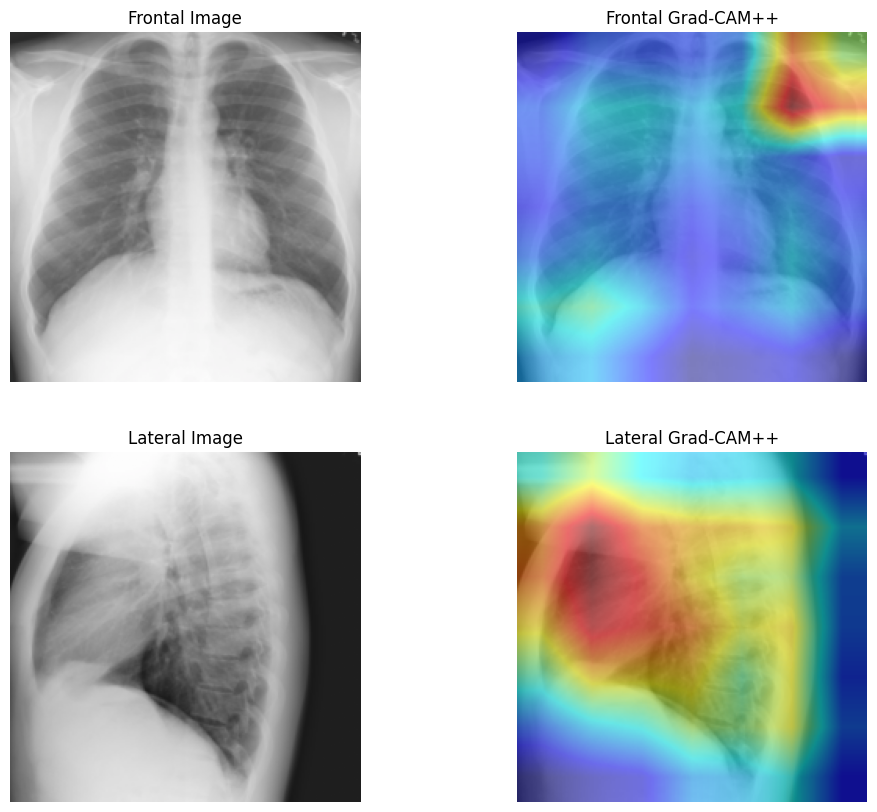


INDICATION:
neck pain

FINDINGS:
cardiomediastinal silhouette and pulmonary vasculature are within normal limits. lungs are clear. no pneumothorax or pleural effusion. no acute osseous findings.

IMPRESSION:
no acute cardiopulmonary findings.

GENERATED FINDINGS:
lungs are clear bilaterally. cardiac and mediastinal silhouettes are normal. pulmonary vasculature is normal. no pneumothorax or pleural effusion. no acute bony abnormality

GENERATED IMPRESSION:
no acute cardiopulmonary abnormality

METRICS:
BLEU-1: 0.5926
BLEU-2: 0.4774
BLEU-3: 0.3796
BLEU-4: 0.3090
ROUGE-1: 0.7308
ROUGE-2: 0.4400
ROUGE-L: 0.5385
METEOR: 0.6395
PRECISION: 0.9288
RECALL: 0.9240
F1-SCORE: 0.9264

UID: 1794
F1-SCORE: 0.9246


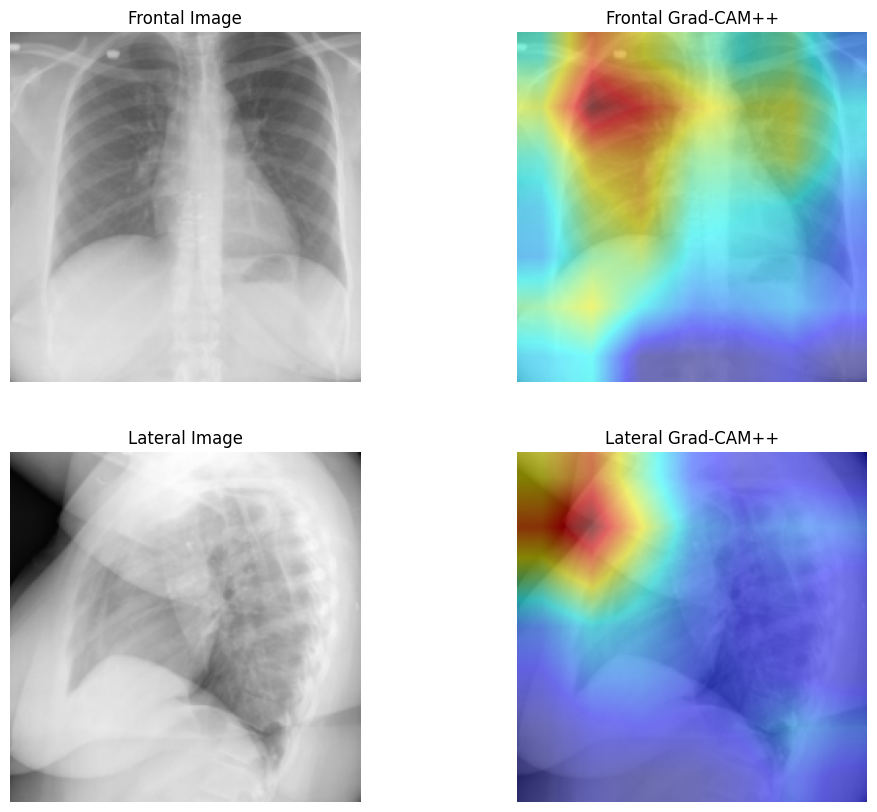


INDICATION:
xxxx-year-old complaining of dizziness

FINDINGS:
no focal lung consolidation. heart size and pulmonary vascularity are within normal limits. no pneumothorax or pleural effusion. osseous structures are grossly intact.

IMPRESSION:
no acute cardiopulmonary process.

GENERATED FINDINGS:
heart size is normal. the lungs are clear. there is no focal airspace consolidation, pneumothorax or large pleural effusion.

GENERATED IMPRESSION:
no acute cardiopulmonary findings.

METRICS:
BLEU-1: 0.4385
BLEU-2: 0.3170
BLEU-3: 0.1590
BLEU-4: 0.0641
ROUGE-1: 0.6000
ROUGE-2: 0.2500
ROUGE-L: 0.4400
METEOR: 0.4318
PRECISION: 0.9342
RECALL: 0.9152
F1-SCORE: 0.9246


In [83]:
# TOP 5 BEST REPORTS
best_reports_df = (evaluation_df.sort_values("F1-SCORE", ascending=False).head(5).reset_index(drop=True))

print("BEST REPORTS:")
display(best_reports_df[["uid", "F1-SCORE"]])

# VISUALIZE BEST REPORTS
for _, row in best_reports_df.iterrows():
    uid = row["uid"]
    print("\n" + "=" * 120)
    print(f"UID: {uid}")
    print(f"F1-SCORE: {row['F1-SCORE']:.4f}")
    print("=" * 120)

    sample_idx = None
    for idx in range(len(test_dataset)):
        if test_dataset[idx]["uid"] == uid:
            sample_idx = idx
            break

    sample = test_dataset[sample_idx]

    frontal_heatmap = generate_gradcam_heatmap(sample["frontal_image"].unsqueeze(0).to(device))
    lateral_heatmap = generate_gradcam_heatmap(sample["lateral_image"].unsqueeze(0).to(device))
    frontal_overlay = overlay_heatmap(sample["frontal_image"],frontal_heatmap)
    lateral_overlay = overlay_heatmap(sample["lateral_image"],lateral_heatmap)

    fig, axes = plt.subplots(2, 2, figsize=(12,10))
    axes[0,0].imshow(tensor_to_rgb(sample["frontal_image"]))
    axes[0,0].set_title("Frontal Image")
    axes[0,0].axis("off")
    axes[0,1].imshow(frontal_overlay)
    axes[0,1].set_title("Frontal Grad-CAM++")
    axes[0,1].axis("off")
    axes[1,0].imshow(tensor_to_rgb(sample["lateral_image"]))
    axes[1,0].set_title("Lateral Image")
    axes[1,0].axis("off")
    axes[1,1].imshow(lateral_overlay)
    axes[1,1].set_title("Lateral Grad-CAM++")
    axes[1,1].axis("off")
    plt.show()

    print("\nINDICATION:")
    print(row["indication"])
    print("\nFINDINGS:")
    print(row["findings"])
    print("\nIMPRESSION:")
    print(row["impression"])
    print("\nGENERATED FINDINGS:")
    print(row["generated_findings"])
    print("\nGENERATED IMPRESSION:")
    print(row["generated_impression"])
    print("\nMETRICS:")
    metric_columns = [
        "BLEU-1",
        "BLEU-2",
        "BLEU-3",
        "BLEU-4",
        "ROUGE-1",
        "ROUGE-2",
        "ROUGE-L",
        "METEOR",
        "PRECISION",
        "RECALL",
        "F1-SCORE"
    ]

    for metric in metric_columns:
        print(f"{metric}: {row[metric]:.4f}")

WORST REPORTS: 


,uid,F1-SCORE
0,2285,0.734890
1,3046,0.755772
2,3148,0.757341
3,3442,0.760749
4,1355,0.763830



UID: 2285
F1-SCORE: 0.7349


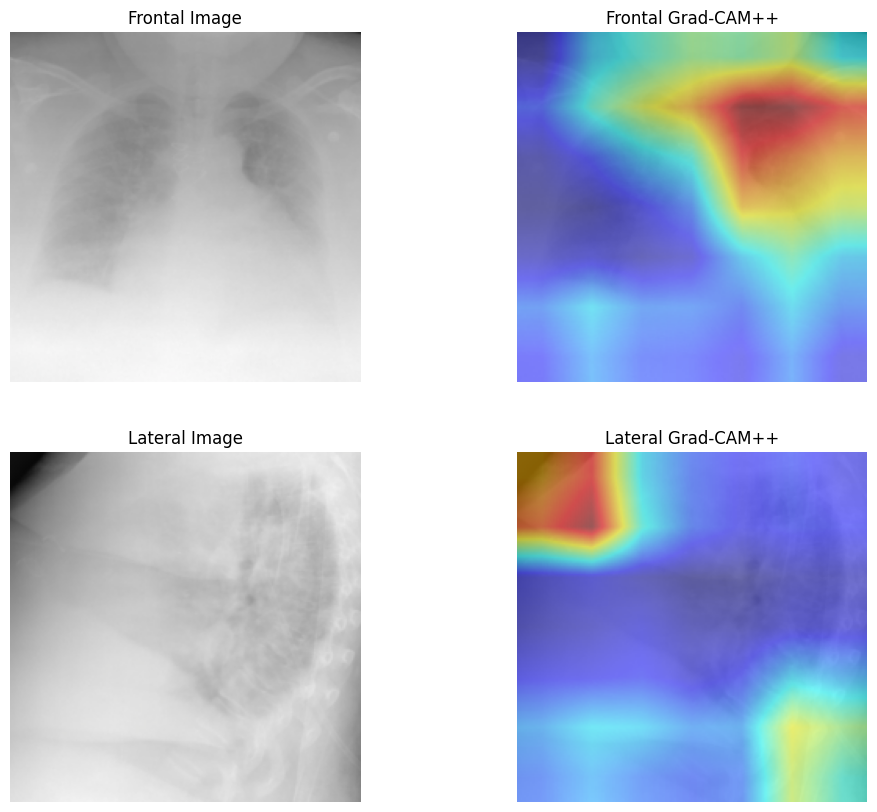


INDICATION:
dyspnea.

FINDINGS:
xxxx sternotomy xxxx and mediastinal postsurgical changes. stable cardiomegaly. crowded bronchovascular and interstitial markings xxxx related to low lung volumes and technique. grossly stable appearance of the lungs compared to prior exam without overt edema or gross airspace consolidation.

IMPRESSION:
xxxx sternotomy xxxx and mediastinal postsurgical changes. stable cardiomegaly. crowded bronchovascular and interstitial markings xxxx related to low lung volumes and technique. grossly stable appearance of the lungs compared to prior exam without overt edema or gross airspace consolidation.

GENERATED FINDINGS:
heart size normal. lungs are clear bilaterally. no pneumothorax or pleural effusion. cardiomediastinal silhouette is within normal limits. xxxx are unremarkable.

GENERATED IMPRESSION:
no acute cardiopulmonary abnormality.

METRICS:
BLEU-1: 0.0144
BLEU-2: 0.0027
BLEU-3: 0.0016
BLEU-4: 0.0012
ROUGE-1: 0.0583
ROUGE-2: 0.0000
ROUGE-L: 0.0583
METEOR

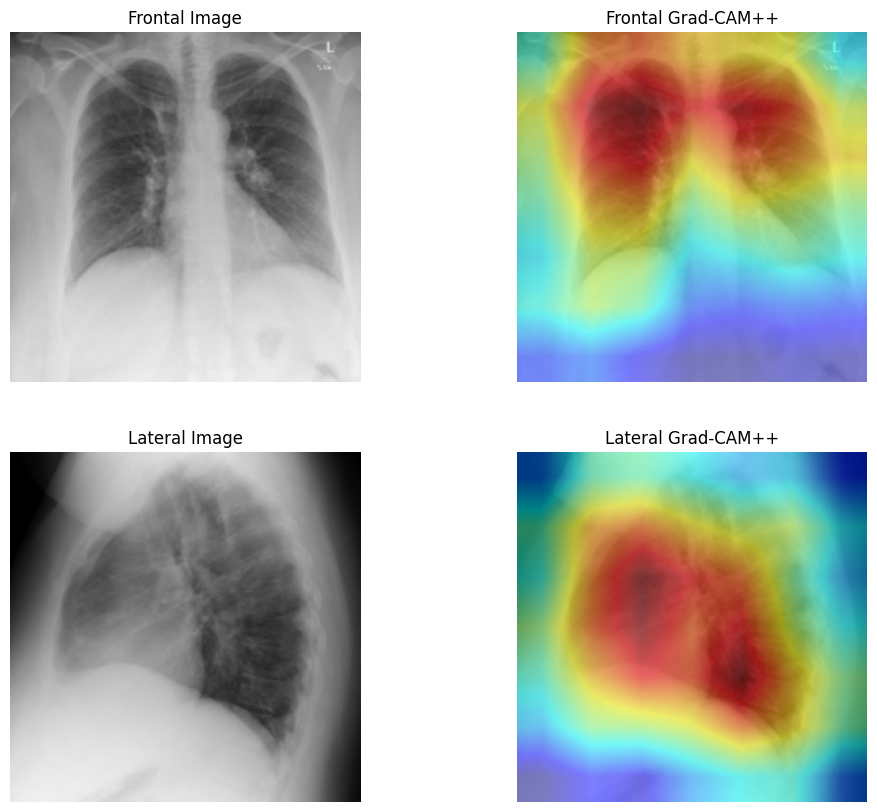


INDICATION:
the patient is a xxxx-year-old female with right upper quadrant pain, frequent xxxx, possible rib fracture..

FINDINGS:
redemonstration of azygos lobe. redemonstrated left perihilar nodular opacity, similar in size from previous examination. dense appearing, may be granulomatous. the trachea is midline. negative for pneumothorax, pleural effusion or focal airspace consolidation. the heart size is normal. xxxx. limited exam, for evaluation of fractures. however, no evidence for displaced rib fracture.

IMPRESSION:
1. left perihilar nodular opacity redemonstrated, appears dense, may be granulomatous, if desired one may consider ct for further characterization. 2. no acute cardiopulmonary abnormality. redemonstrated azygos lobe. 3. no fracture visible. if clinical concern persists, consider dedicated rib series.

GENERATED FINDINGS:
the patient and the adjacent spaces are clear. both lungs are clear. heart and mediastinum are normal. xxxx are normal.

GENERATED IMPRESSION:
no

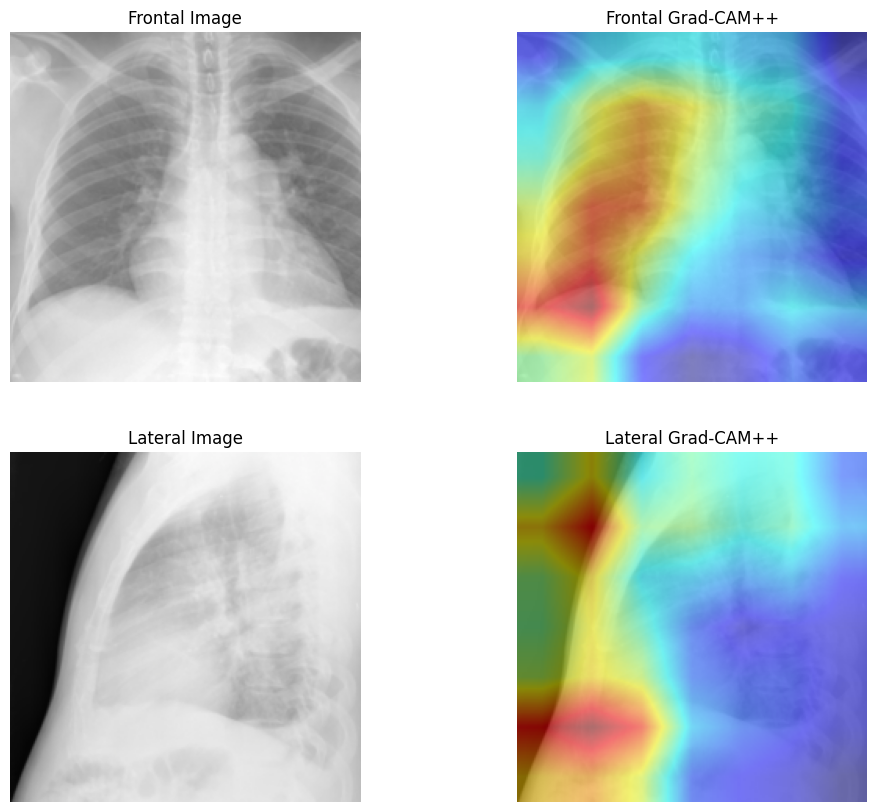


INDICATION:
xxxx

FINDINGS:
stable cardiomediastinal contour is mild cardiomegaly. no pneumothorax or significant pulmonary edema. small left pleural effusion. no focal lung consolidation. mildly low lung volumes.

IMPRESSION:
1. small left pleural effusion. 2. stable mild cardiomegaly.

GENERATED FINDINGS:
the heart is normal in size. the mediastinum is unremarkable. the lungs are clear.

GENERATED IMPRESSION:
no acute disease.

METRICS:
BLEU-1: 0.0459
BLEU-2: 0.0106
BLEU-3: 0.0066
BLEU-4: 0.0053
ROUGE-1: 0.1200
ROUGE-2: 0.0000
ROUGE-L: 0.0800
METEOR: 0.0478
PRECISION: 0.7804
RECALL: 0.7356
F1-SCORE: 0.7573

UID: 3442
F1-SCORE: 0.7607


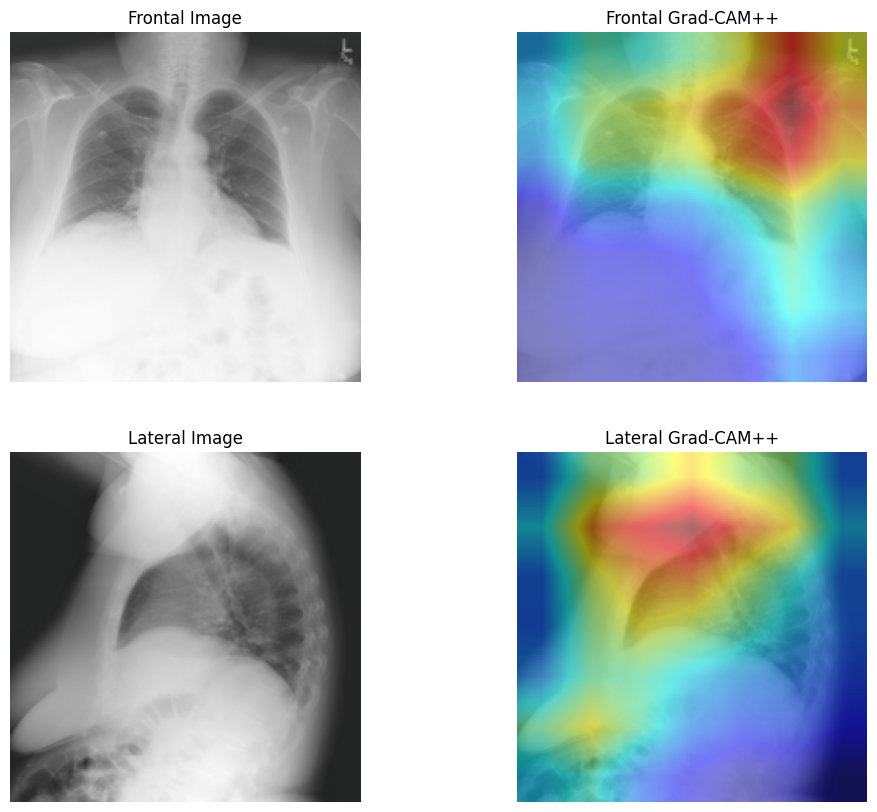


INDICATION:
xxxx distress

FINDINGS:
normal cardiomediastinal contours. low lung volumes with minimal left basilar opacities. no pneumothorax or pleural effusions.

IMPRESSION:
minimal left basilar atelectasis versus infiltrate. low lung volumes.

GENERATED FINDINGS:
the heart and lungs have xxxx xxxx in the interval. both lungs are clear and expanded. heart and mediastinum normal.

GENERATED IMPRESSION:
no active disease.

METRICS:
BLEU-1: 0.0399
BLEU-2: 0.0129
BLEU-3: 0.0090
BLEU-4: 0.0076
ROUGE-1: 0.1667
ROUGE-2: 0.0000
ROUGE-L: 0.0833
METEOR: 0.0605
PRECISION: 0.7765
RECALL: 0.7456
F1-SCORE: 0.7607

UID: 1355
F1-SCORE: 0.7638


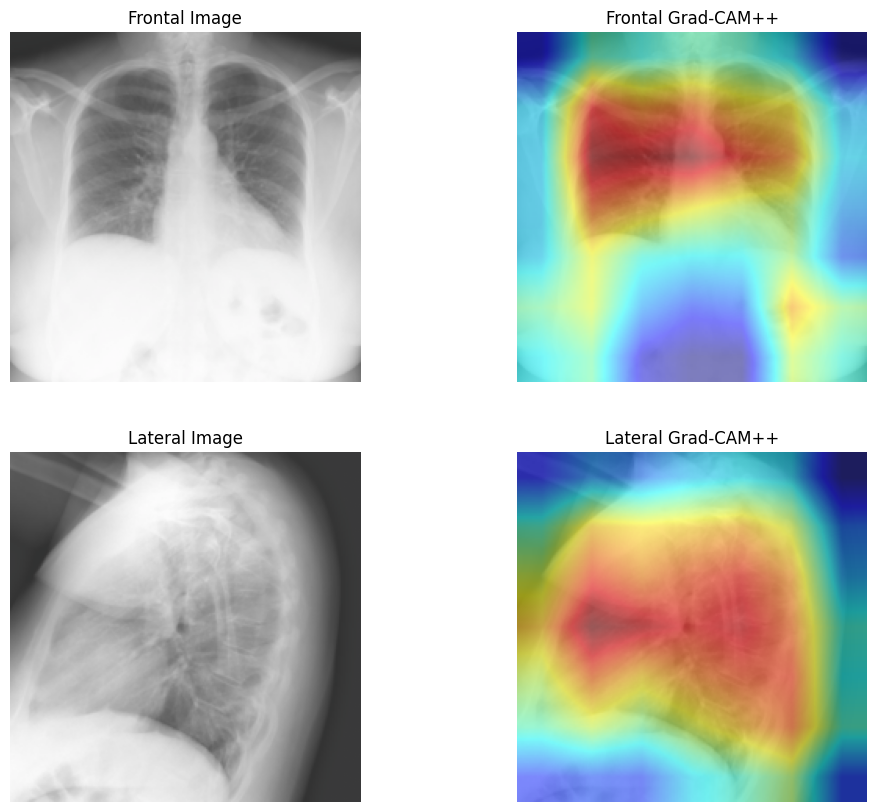


INDICATION:
xxxx year old female, chest pain

FINDINGS:
low lung volumes with streaky bibasilar opacities, right greater than left. bronchovascular crowding, indistinct central vascular margination. no findings to suggest pleural effusion. accounting for technical factors heart size xxxx within normal limits.

IMPRESSION:
low lung volumes with bronchovascular crowding, bibasilar opacities xxxx due at xxxx in part to atelectasis, infiltrates, pulmonary edema difficult to entirely exclude.

GENERATED FINDINGS:
the cardiac contours are normal. the lungs are hyperinflated with flattening of diaphragms. there is no effusion or pneumothorax.

GENERATED IMPRESSION:
hyperinflated lungs with flattened diaphragms but no acute pulmonary disease.

METRICS:
BLEU-1: 0.0544
BLEU-2: 0.0087
BLEU-3: 0.0048
BLEU-4: 0.0036
ROUGE-1: 0.1882
ROUGE-2: 0.0000
ROUGE-L: 0.1647
METEOR: 0.0563
PRECISION: 0.7840
RECALL: 0.7446
F1-SCORE: 0.7638


In [84]:
# 5 WORST REPORTS
worst_reports_df = (evaluation_df.sort_values("F1-SCORE", ascending=True).head(5).reset_index(drop=True))

print("WORST REPORTS: ")
display(worst_reports_df[["uid", "F1-SCORE"]])

# VISUALIZE WORST REPORTS
for _, row in worst_reports_df.iterrows():
    uid = row["uid"]
    print("\n" + "=" * 120)
    print(f"UID: {uid}")
    print(f"F1-SCORE: {row['F1-SCORE']:.4f}")
    print("=" * 120)
    sample_idx = None
    for idx in range(len(test_dataset)):
        if test_dataset[idx]["uid"] == uid:
            sample_idx = idx
            break

    sample = test_dataset[sample_idx]

    frontal_heatmap = generate_gradcam_heatmap(sample["frontal_image"].unsqueeze(0).to(device))
    lateral_heatmap = generate_gradcam_heatmap(sample["lateral_image"].unsqueeze(0).to(device))
    frontal_overlay = overlay_heatmap(sample["frontal_image"],frontal_heatmap)
    lateral_overlay = overlay_heatmap(sample["lateral_image"],lateral_heatmap)

    fig, axes = plt.subplots(2, 2, figsize=(12,10))
    axes[0,0].imshow(tensor_to_rgb(sample["frontal_image"]))
    axes[0,0].set_title("Frontal Image")
    axes[0,0].axis("off")
    axes[0,1].imshow(frontal_overlay)
    axes[0,1].set_title("Frontal Grad-CAM++")
    axes[0,1].axis("off")
    axes[1,0].imshow(tensor_to_rgb(sample["lateral_image"]))
    axes[1,0].set_title("Lateral Image")
    axes[1,0].axis("off")
    axes[1,1].imshow(lateral_overlay)
    axes[1,1].set_title("Lateral Grad-CAM++")
    axes[1,1].axis("off")
    plt.show()

    print("\nINDICATION:")
    print(row["indication"])
    print("\nFINDINGS:")
    print(row["findings"])
    print("\nIMPRESSION:")
    print(row["impression"])
    print("\nGENERATED FINDINGS:")
    print(row["generated_findings"])
    print("\nGENERATED IMPRESSION:")
    print(row["generated_impression"])

    print("\nMETRICS:")
    for metric in metric_columns:
        print(f"{metric}: {row[metric]:.4f}")

UID: 2652


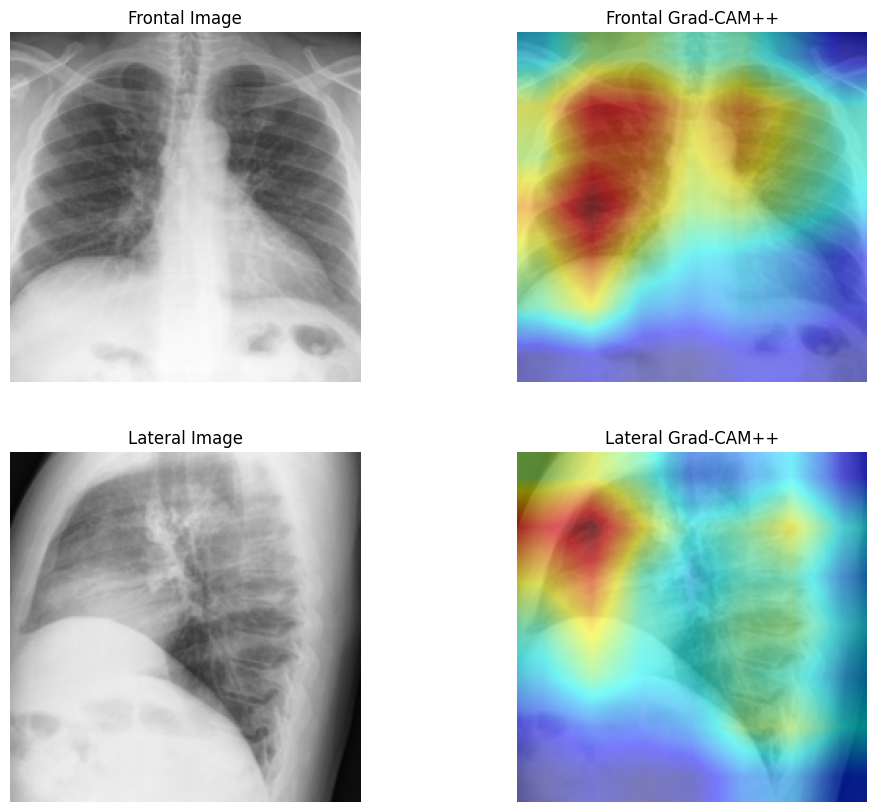


INDICATION:
positive ppd. xxxx.

FINDINGS:
xxxx xxxx and lateral chest examination was obtained. the heart silhouette and mediastinal contours are not enlarged. there is calcified mediastinal lymph xxxx. lungs demonstrate no acute findings. there is no effusion or pneumothorax.

IMPRESSION:
1. no acute pulmonary disease.

GENERATED FINDINGS:
the heart is normal size. the mediastinum is unremarkable. the lungs are hyperexpanded but clear.

GENERATED IMPRESSION:
no acute disease.

METRICS:
BLEU-1: 0.1557
BLEU-2: 0.0755
BLEU-3: 0.0223
BLEU-4: 0.0123
ROUGE-1: 0.3158
ROUGE-2: 0.0727
ROUGE-L: 0.2456
METEOR: 0.1583
PRECISION: 0.8648
RECALL: 0.7992
F1-SCORE: 0.8307
UID: 2965


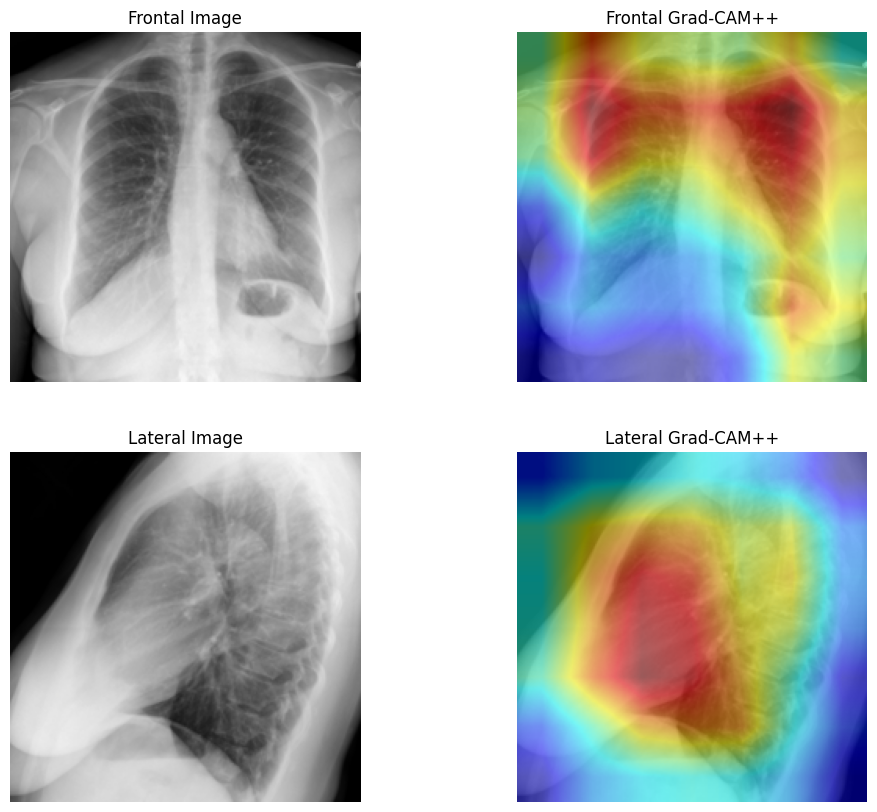


INDICATION:
xxxx-year-old female with positive ppd.

FINDINGS:
heart size within normal limits. no focal airspace disease. no pleural effusion. no pneumothorax.

IMPRESSION:
no acute cardiopulmonary findings. specifically, no radiographic evidence of tuberculosis.

GENERATED FINDINGS:
heart size and mediastinal contours appear within normal limits. no focal airspace consolidation, pleural effusion, or pneumothorax identified. no acute bony or soft tissue abnormality.

GENERATED IMPRESSION:
no acute cardiopulmonary abnormality.

METRICS:
BLEU-1: 0.4483
BLEU-2: 0.3579
BLEU-3: 0.2873
BLEU-4: 0.2287
ROUGE-1: 0.5660
ROUGE-2: 0.3529
ROUGE-L: 0.5283
METEOR: 0.4688
PRECISION: 0.9021
RECALL: 0.9294
F1-SCORE: 0.9155
UID: 1745


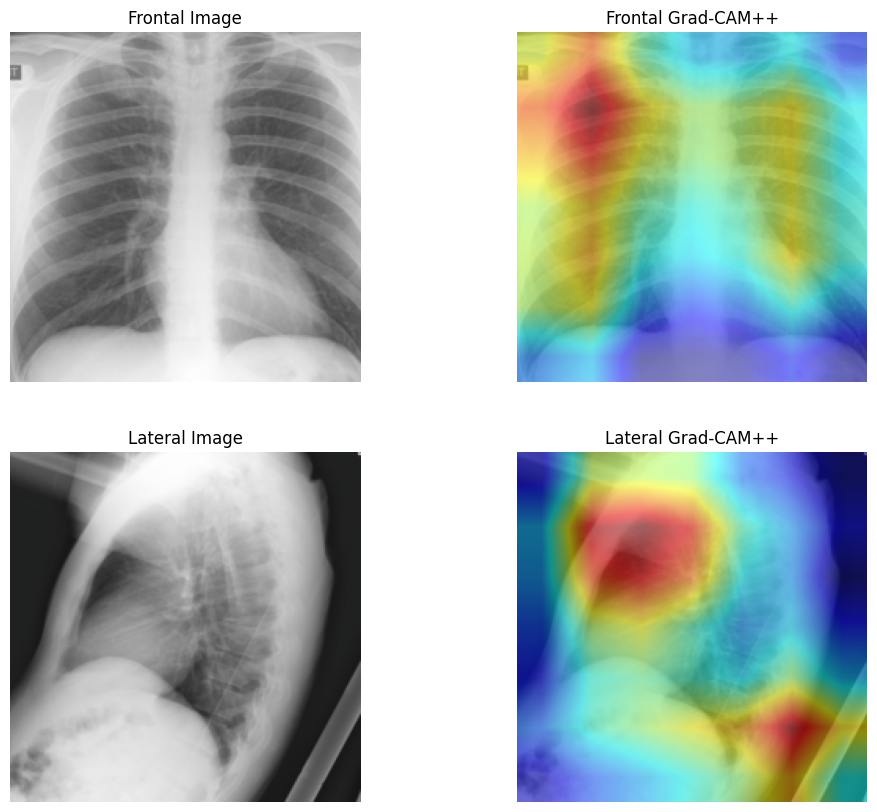


INDICATION:
xxxx. mva today.

FINDINGS:
frontal and lateral views of the chest show normal size cardiac silhouette, allowing for an ap projection. normal contour of the mediastinum and aorta. grossly clear lungs. no obvious pneumothorax or hemothorax. no acute displaced clavicle or rib fractures.

IMPRESSION:
no acute thoracic xxxx.

GENERATED FINDINGS:
the xxxx examination consists of frontal and lateral radiographs of the chest. there are several xxxx films of the chest on the frontal view. the cardiomediastinal contours are within normal limits in size and contour. pulmonary vascularity is within normal limits. no focal consolidation, pleural effusion, or pneumothorax identified. no acute bony abnormalities identified.

GENERATED IMPRESSION:
no acute cardiopulmonary process.

METRICS:
BLEU-1: 0.3276
BLEU-2: 0.2006
BLEU-3: 0.1128
BLEU-4: 0.0402
ROUGE-1: 0.4356
ROUGE-2: 0.1414
ROUGE-L: 0.2970
METEOR: 0.3114
PRECISION: 0.8533
RECALL: 0.8712
F1-SCORE: 0.8622
UID: 3634


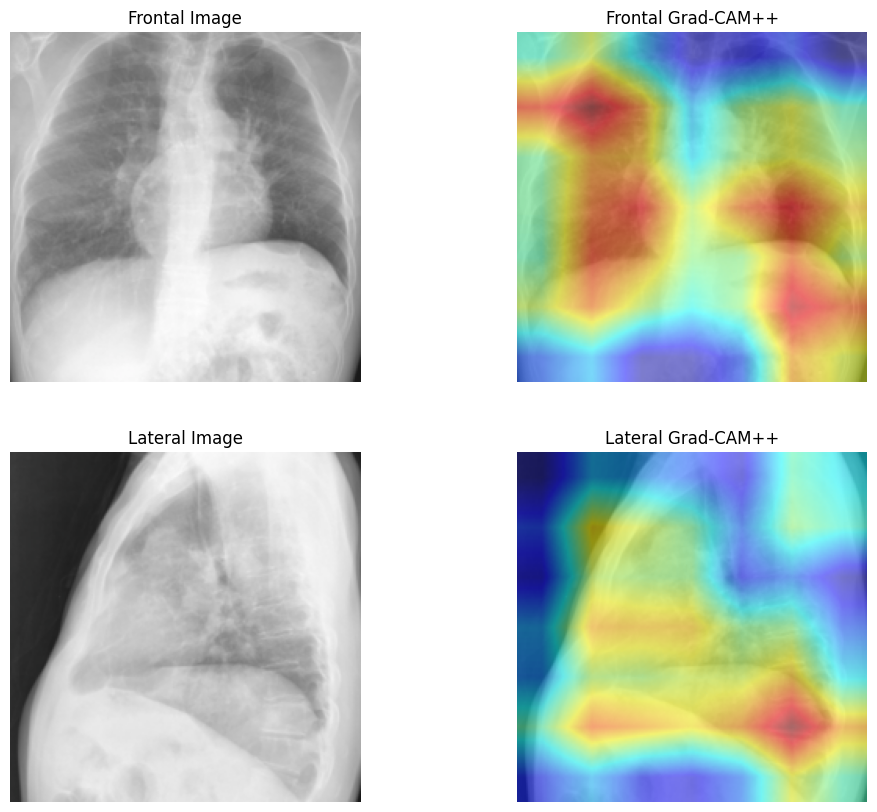


INDICATION:
xxxx-year-old with xxxx.

FINDINGS:
stable cardiomediastinal silhouette. no focal pulmonary opacity, pleural effusion or pneumothorax. no acute bony abnormality.

IMPRESSION:
no acute cardiopulmonary abnormality.

GENERATED FINDINGS:
cardiomediastinal silhouette is within normal limits. low lung volumes. no pneumothorax or large pleural effusions. no acute osseous findings.

GENERATED IMPRESSION:
low lung volumes.

METRICS:
BLEU-1: 0.2727
BLEU-2: 0.1140
BLEU-3: 0.0402
BLEU-4: 0.0242
ROUGE-1: 0.4390
ROUGE-2: 0.1538
ROUGE-L: 0.3415
METEOR: 0.2209
PRECISION: 0.9094
RECALL: 0.9051
F1-SCORE: 0.9073
UID: 1560


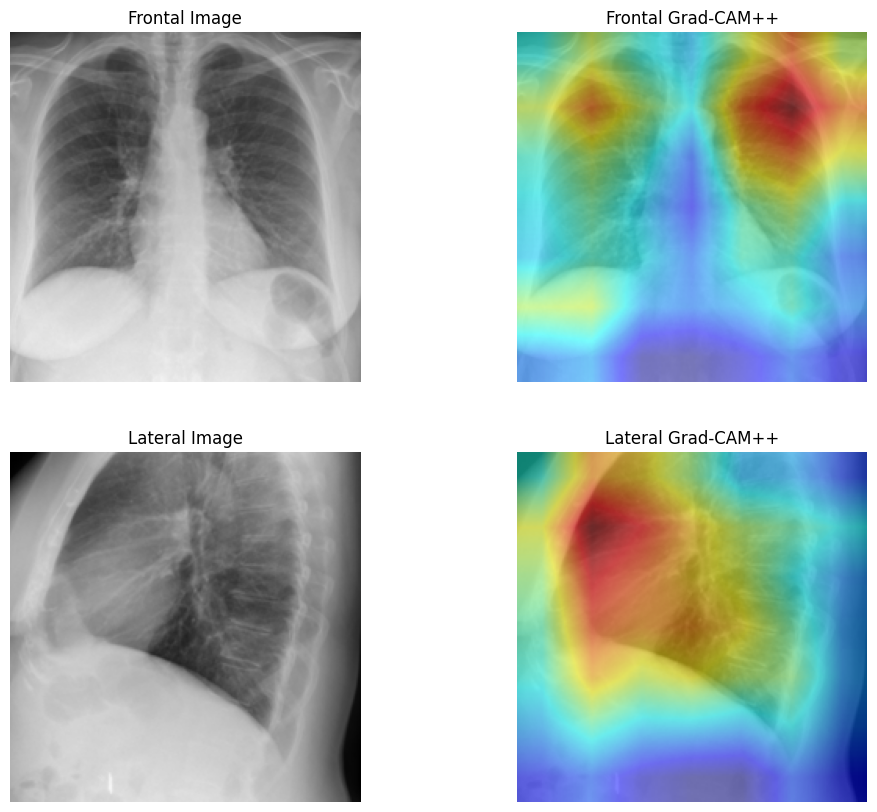


INDICATION:
xxxx-year-old female with blood-tinged sputum.

FINDINGS:
normal heart. clear lungs. no pneumothorax. no pleural effusion.

IMPRESSION:
no acute findings.

GENERATED FINDINGS:
cardiomegaly is present. negative for focal pulmonary consolidation, pleural effusion, or pneumothorax identified. normal heart size.

GENERATED IMPRESSION:
negative for acute abnormality.

METRICS:
BLEU-1: 0.1500
BLEU-2: 0.0281
BLEU-3: 0.0164
BLEU-4: 0.0127
ROUGE-1: 0.3750
ROUGE-2: 0.1333
ROUGE-L: 0.1875
METEOR: 0.1172
PRECISION: 0.8605
RECALL: 0.9103
F1-SCORE: 0.8847
UID: 692


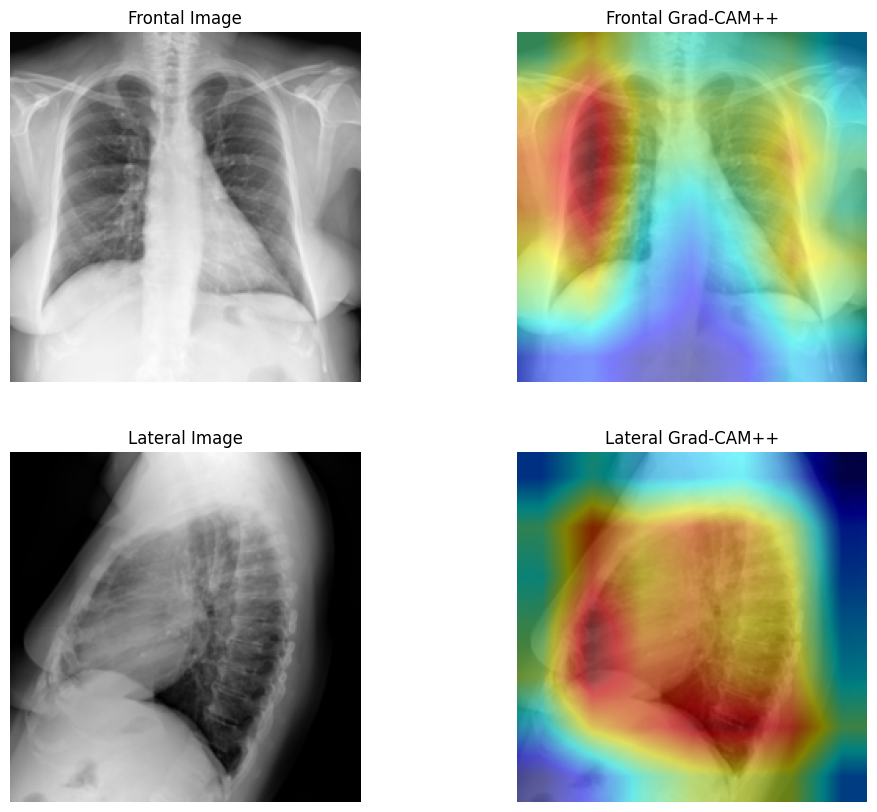


INDICATION:
pre op sarcoma

FINDINGS:
the lungs are clear. there are calcified granulomas. heart size is normal. no pneumothorax. there are endplate changes in the spine.

IMPRESSION:
clear lungs. no acute cardiopulmonary abnormality. .

GENERATED FINDINGS:
heart size normal. lungs are clear. xxxx are normal. no pneumonia, effusions, edema, pneumothorax, adenopathy, nodules or masses.

GENERATED IMPRESSION:
normal chest

METRICS:
BLEU-1: 0.2681
BLEU-2: 0.1945
BLEU-3: 0.1121
BLEU-4: 0.0486
ROUGE-1: 0.3830
ROUGE-2: 0.1778
ROUGE-L: 0.2979
METEOR: 0.1956
PRECISION: 0.8606
RECALL: 0.8506
F1-SCORE: 0.8556
UID: 403


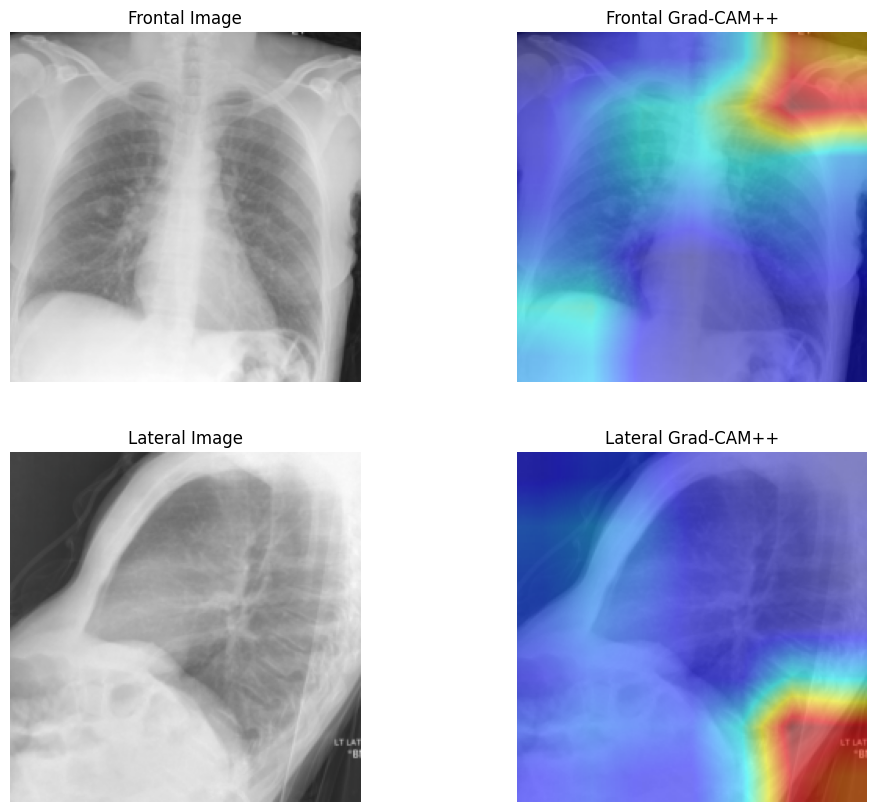


INDICATION:
xxxx-year-old female with chest pain.

FINDINGS:
heart size within normal limits. no focal airspace disease. no pneumothorax. no effusions. multiple old right-sided rib fractures again noted.

IMPRESSION:
no acute cardiopulmonary findings.

GENERATED FINDINGS:
the lungs remain clear. some of the pleural fluid is xxxx in size and contour consistent with emphysematous disease. there are diffuse bilateral calcific opacities which may represent subsegmental atelectasis or adenopathy. the heart and mediastinum are normal. the skeletal structures and soft tissues are grossly intact.

GENERATED IMPRESSION:
1. clear lungs. this could be pulmonary sarcoidosis or sarcoidosis of the sarcoid.

METRICS:
BLEU-1: 0.0500
BLEU-2: 0.0092
BLEU-3: 0.0053
BLEU-4: 0.0040
ROUGE-1: 0.0941
ROUGE-2: 0.0000
ROUGE-L: 0.0471
METEOR: 0.0543
PRECISION: 0.7585
RECALL: 0.7949
F1-SCORE: 0.7762
UID: 66


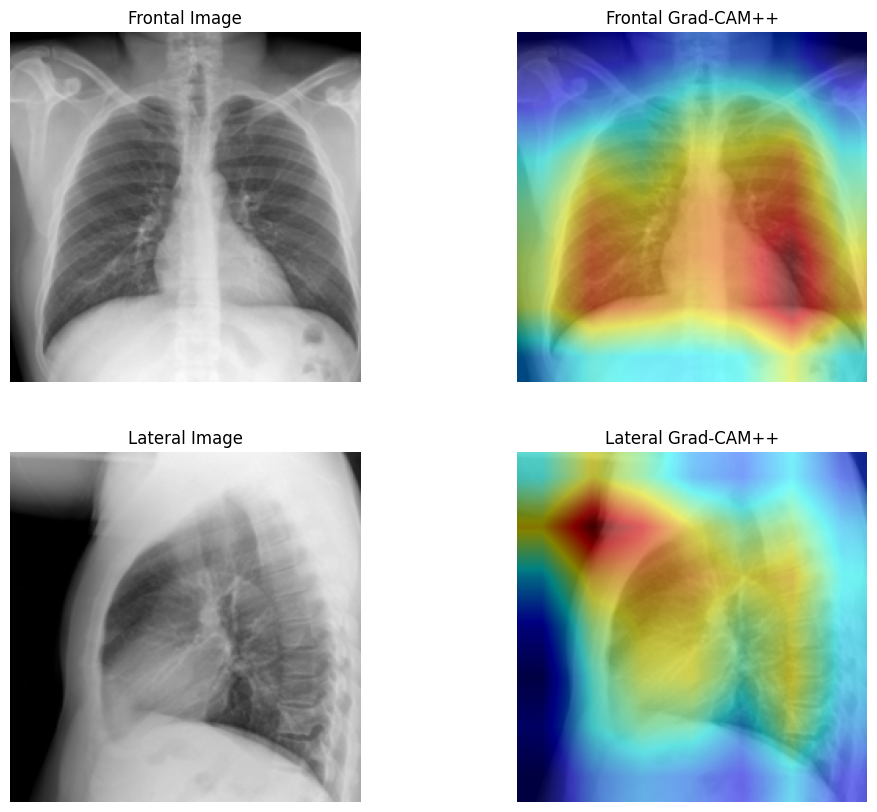


INDICATION:
hematemesis; back pain 724.5

FINDINGS:
chest. both lungs are clear and expanded with no pleural air collections or parenchymal consolidations. heart and mediastinum remain normal. lumbosacral spine. xxxx, disc spaces, and alignment are normal. sacrum and sacroiliac joints are normal.

IMPRESSION:
1. chest. no active disease. 2. lumbar spine negative.

GENERATED FINDINGS:
heart size, mediastinal contour, and pulmonary vascularity are within normal limits. the lungs are free of focal airspace disease. no pleural effusion or pneumothorax is seen. there are calcified granulomas throughout the thoracic spine. degenerative changes of the spine.

GENERATED IMPRESSION:
no evidence of active disease.

METRICS:
BLEU-1: 0.2955
BLEU-2: 0.1436
BLEU-3: 0.0366
BLEU-4: 0.0186
ROUGE-1: 0.3409
ROUGE-2: 0.0698
ROUGE-L: 0.2045
METEOR: 0.2060
PRECISION: 0.8281
RECALL: 0.8268
F1-SCORE: 0.8274
UID: 2364


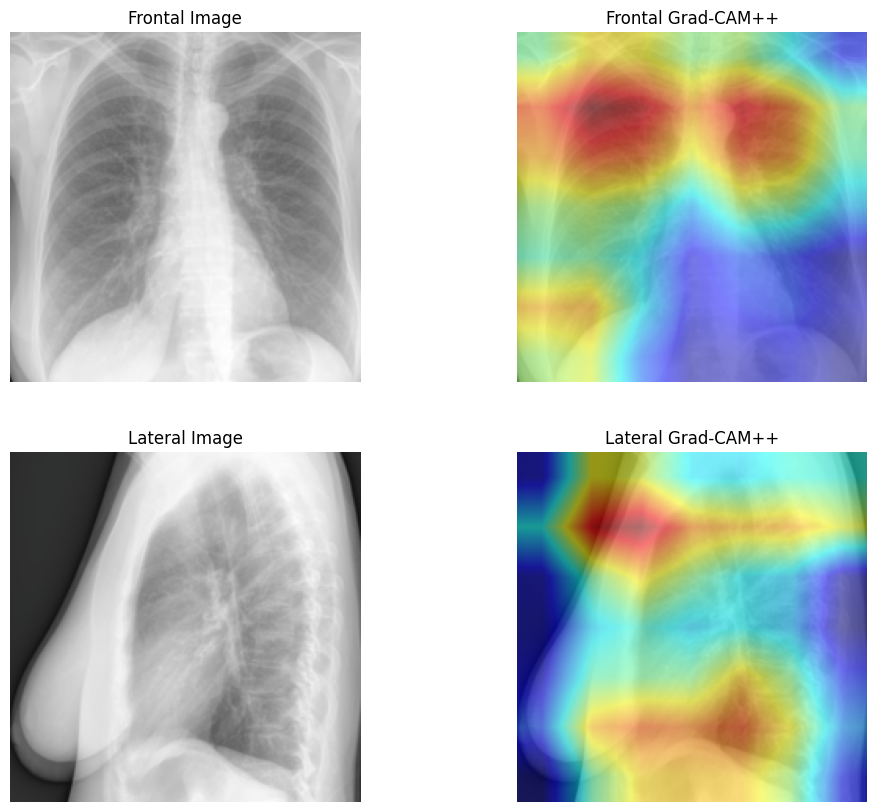


INDICATION:
786.05-

FINDINGS:
the lungs are clear. there is hyperexpansion of the lungs suggesting underlying emphysema. the heart and pulmonary xxxx appear normal. pleural spaces are clear. mediastinal contours are normal.

IMPRESSION:
no acute cardiopulmonary disease

GENERATED FINDINGS:
heart size and pulmonary vascularity appear within normal limits. the lungs are free of focal airspace disease. no pleural effusion or pneumothorax is seen. however, there is a small t-spine osteophyte formation throughout.

GENERATED IMPRESSION:
no evidence of active disease.

METRICS:
BLEU-1: 0.3158
BLEU-2: 0.1848
BLEU-3: 0.0982
BLEU-4: 0.0406
ROUGE-1: 0.3944
ROUGE-2: 0.1159
ROUGE-L: 0.2254
METEOR: 0.2616
PRECISION: 0.8278
RECALL: 0.8449
F1-SCORE: 0.8362
UID: 3229


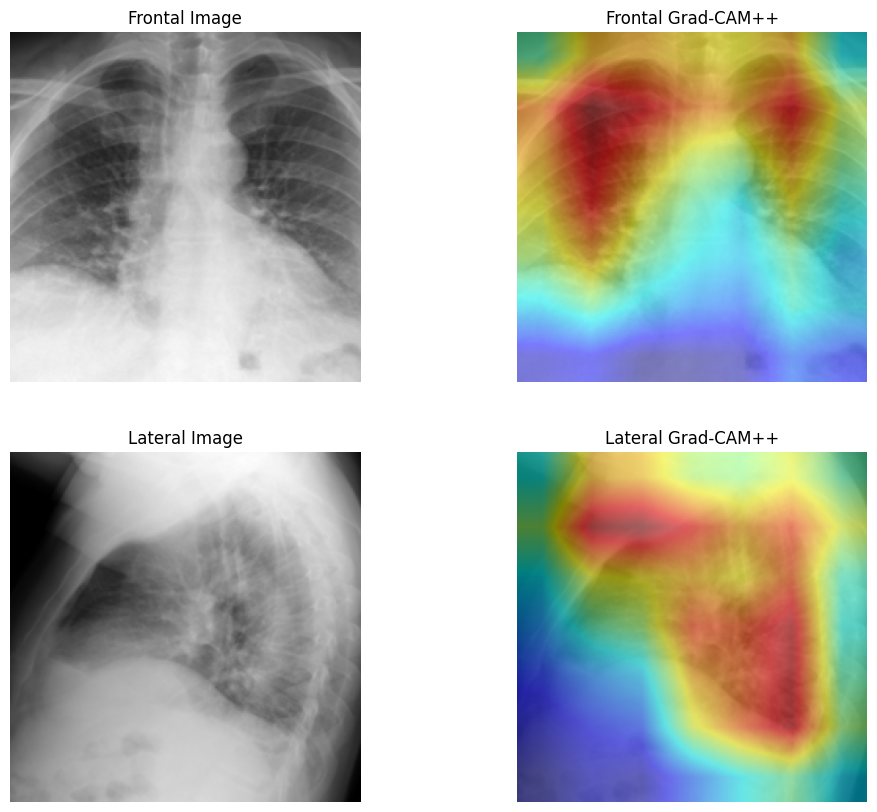


INDICATION:
xxxx with xxxx, neuropathy

FINDINGS:
heart size within normal limits. trachea is midline. the lung volumes are is somewhat low. both lungs are otherwise clear bilaterally. no pleural effusion. no pulmonary nodules visualized.

IMPRESSION:
no pulmonary nodules. negative chest.

GENERATED FINDINGS:
the cardiomediastinal silhouette appears somewhat larger than previously, with xxxx densities overlying a left central venous catheter with large pleural effusions. pulmonary vasculature is normal in caliber and contour. there are streaky left basilar airspace opacities xxxx representing small circular pulmonary loops, increased from prior. no acute bony abnormality. no pneumothorax.

GENERATED IMPRESSION:
mild pulmonary edema with streaky left basilar airspace disease, unchanged from prior exam.

METRICS:
BLEU-1: 0.1562
BLEU-2: 0.0157
BLEU-3: 0.0074
BLEU-4: 0.0051
ROUGE-1: 0.2268
ROUGE-2: 0.0211
ROUGE-L: 0.1443
METEOR: 0.1385
PRECISION: 0.7840
RECALL: 0.8511
F1-SCORE: 0.8161


In [85]:
NUM_SAMPLES = 10
for idx in range(NUM_SAMPLES):
    sample = test_dataset[idx]
    row = evaluation_df[evaluation_df["uid"] == sample["uid"]].iloc[0]
    frontal_heatmap = generate_gradcam_heatmap(sample["frontal_image"].unsqueeze(0).to(device))
    lateral_heatmap = generate_gradcam_heatmap(sample["lateral_image"].unsqueeze(0).to(device))
    frontal_overlay = overlay_heatmap(sample["frontal_image"], frontal_heatmap)
    lateral_overlay = overlay_heatmap(sample["lateral_image"], lateral_heatmap)

    fig, axes = plt.subplots(2, 2, figsize=(12,10))
    axes[0,0].imshow(tensor_to_rgb(sample["frontal_image"]))
    axes[0,0].set_title("Frontal Image")
    axes[0,0].axis("off")
    axes[0,1].imshow(frontal_overlay)
    axes[0,1].set_title("Frontal Grad-CAM++")
    axes[0,1].axis("off")
    axes[1,0].imshow(tensor_to_rgb(sample["lateral_image"]))
    axes[1,0].set_title("Lateral Image")
    axes[1,0].axis("off")
    axes[1,1].imshow(lateral_overlay)
    axes[1,1].set_title("Lateral Grad-CAM++")
    axes[1,1].axis("off")
    
    print("UID:", row["uid"])
    plt.show()

    print("\nINDICATION:")
    print(row["indication"])
    print("\nFINDINGS:")
    print(row["findings"])
    print("\nIMPRESSION:")
    print(row["impression"])
    print("\nGENERATED FINDINGS:")
    print(row["generated_findings"])
    print("\nGENERATED IMPRESSION:")
    print(row["generated_impression"])
    print("\nMETRICS:")
    for metric in [
        "BLEU-1",
        "BLEU-2",
        "BLEU-3",
        "BLEU-4",
        "ROUGE-1",
        "ROUGE-2",
        "ROUGE-L",
        "METEOR",
        "PRECISION",
        "RECALL",
        "F1-SCORE"
    ]:

        print(f"{metric}: {row[metric]:.4f}")

    print("="*120)